In [1]:
import arviz as az
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import pymc3 as pm
import scipy.stats as stats

from scipy.interpolate import griddata

In [2]:
%config InlineBackend.figure_format = 'retina'
az.style.use('arviz-darkgrid')
%load_ext watermark
az.rcParams["stats.hdi_prob"] = 0.89  # sets default credible interval used by arviz

#### Simulation of field trip

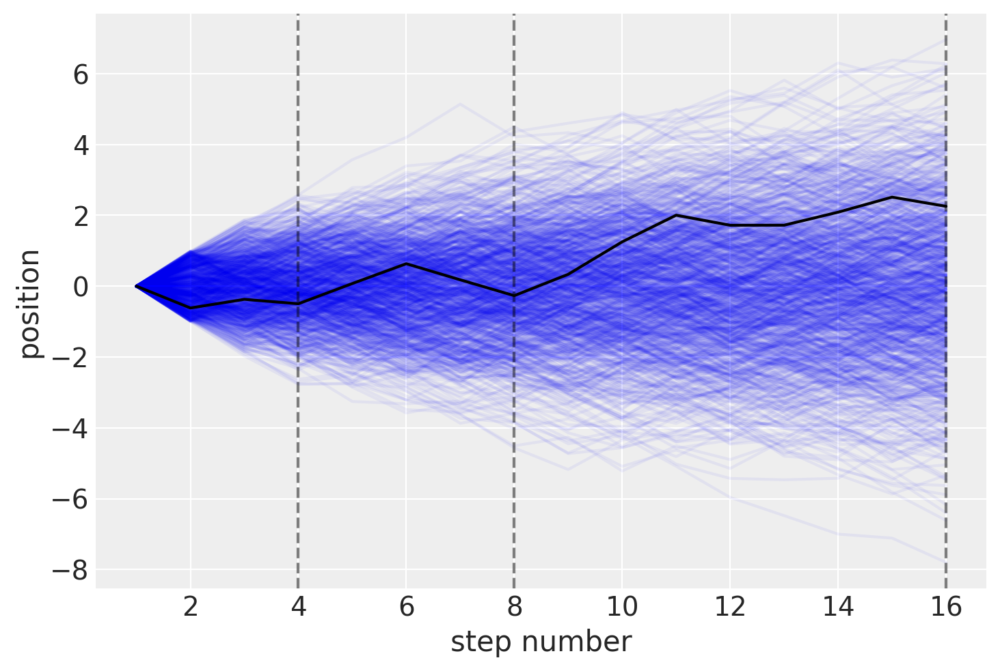

In [3]:
np.random.seed(1234)
steps = 16
repetitions = 1000
x = np.zeros([steps, repetitions])
for i in range(x.shape[1]):
    x[1:, i] = np.cumsum(np.random.uniform(-1, 1, steps - 1))

plt.plot(range(1, 17), x[:, :], c="b", alpha=0.05)
plt.plot(range(1, 17), x[:, 0], c="k")
plt.axvline(4, linestyle="--", c="k", alpha=0.5)
plt.axvline(8, linestyle="--", c="k", alpha=0.5)
plt.axvline(16, linestyle="--", c="k", alpha=0.5)
plt.xlabel("step number")
plt.ylabel("position")
plt.show()

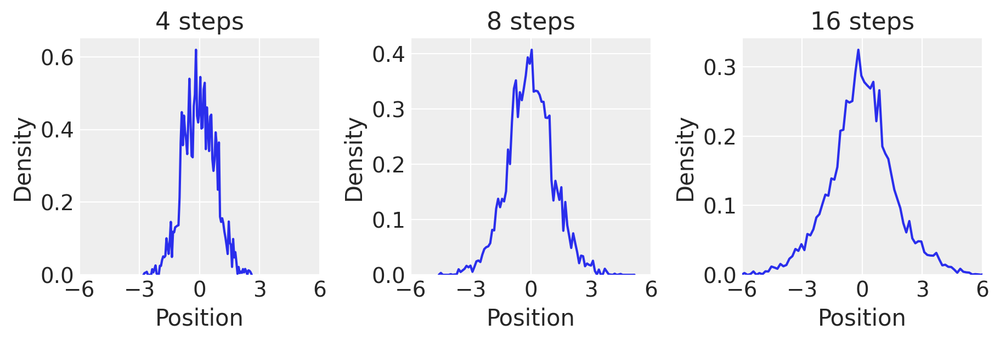

In [4]:
fig, ax = plt.subplots(1, 3, figsize=(9, 3), sharex=True)
sns.distplot(x[1:4, :], kde_kws={"bw": 0.01}, ax=ax[0], hist=False)
sns.distplot(x[1:8, :], kde_kws={"bw": 0.01}, ax=ax[1], hist=False)
sns.distplot(x[1:, :], kde_kws={"bw": 0.01}, ax=ax[2], hist=False)

ax[0].set_title("4 steps")
ax[1].set_title("8 steps")
ax[2].set_title("16 steps")

for i in range(3):
    ax[i].set_ylabel("Density")
    ax[i].set_xlabel("Position")
    ax[i].set_xlim(-6, 6)
    ax[i].set_xticks([-6, -3, 0, 3, 6])

#### Code 4.1

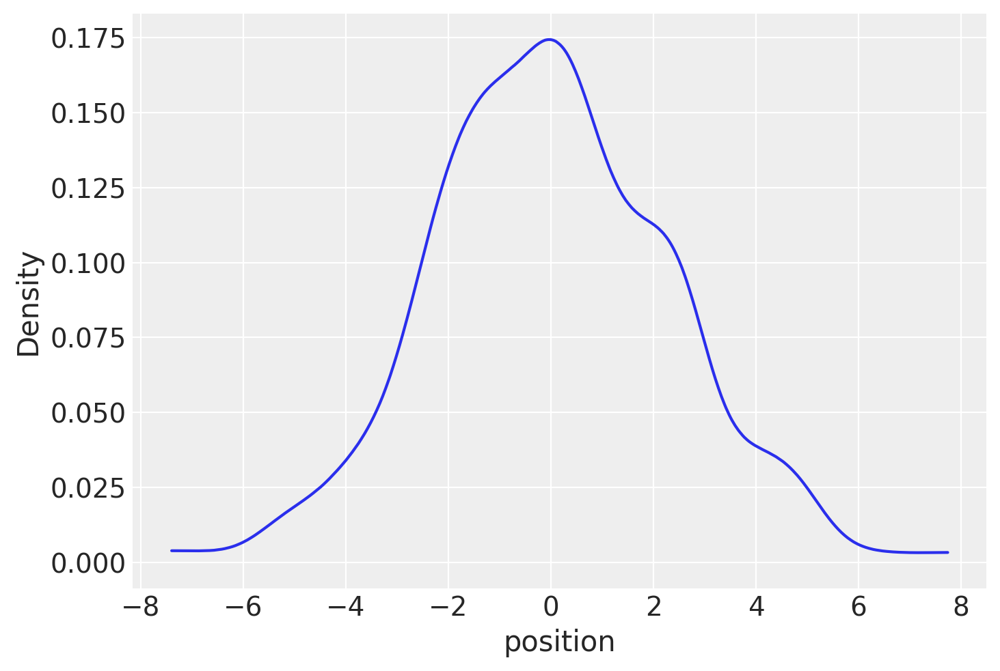

In [5]:
pos = np.random.uniform(-1, 1, size=(16, 1000)).sum(0)
az.plot_kde(pos)
plt.xlabel("position")
plt.ylabel("Density");

#### Code 4.2 and 4.3

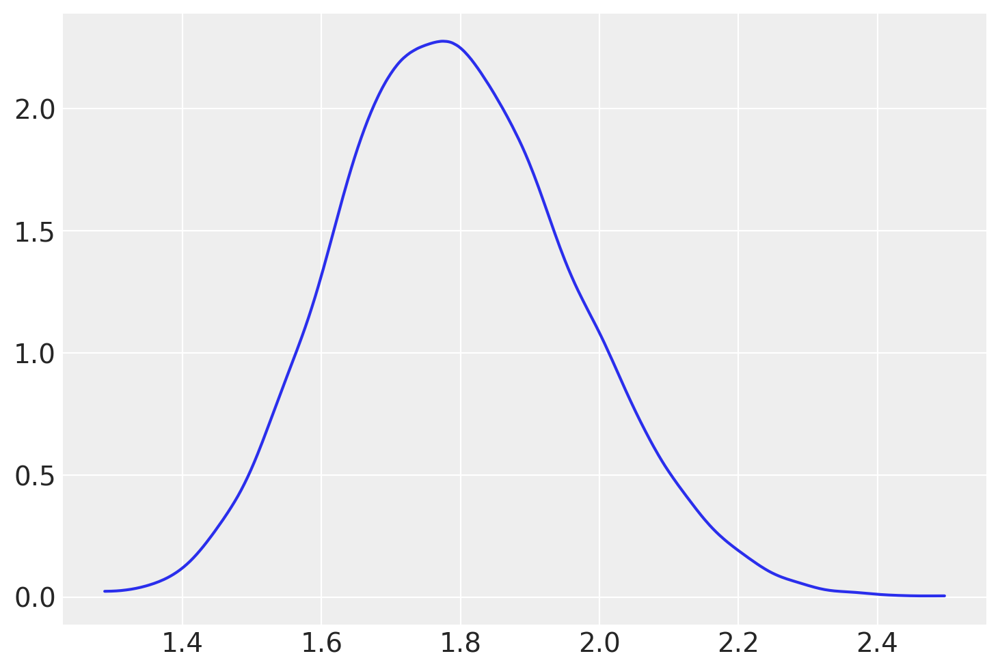

In [6]:
pos = np.random.uniform(1, 1.1, size=(12, 10000)).prod(0)
az.plot_kde(pos);

#### Code 4.4

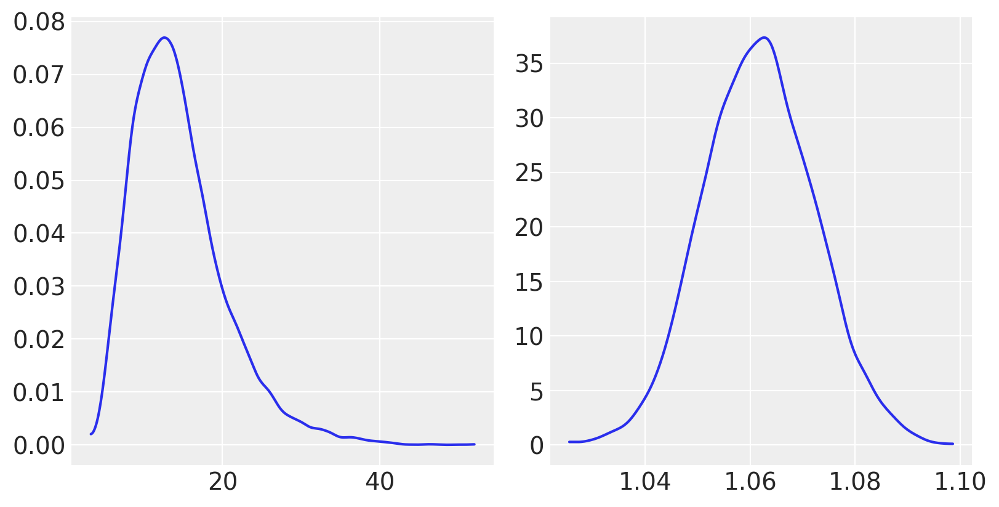

In [7]:
big = np.random.uniform(1, 1.5, size=(12, 10000)).prod(0)
small = np.random.uniform(1, 1.01, size=(12, 10000)).prod(0)
_, ax = plt.subplots(1, 2, figsize=(8, 4))
az.plot_kde(big, ax=ax[0])
az.plot_kde(small, ax=ax[1]);

#### Code 4.5

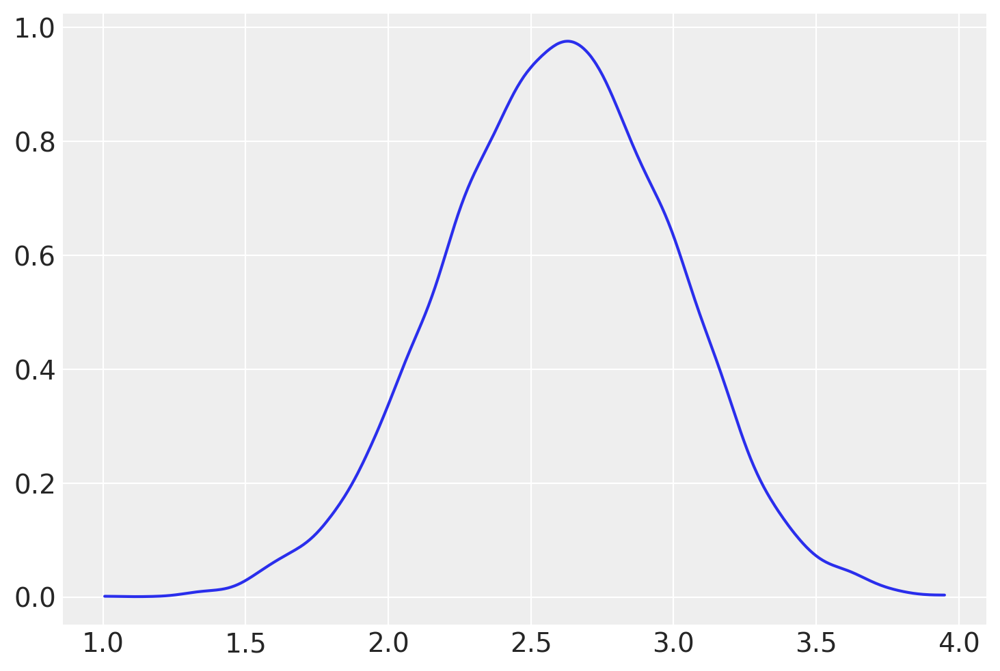

In [8]:
log_big = np.log(np.random.uniform(1, 1.5, size=(12, 10000)).prod(0))
az.plot_kde(log_big);

#### Code 4.6

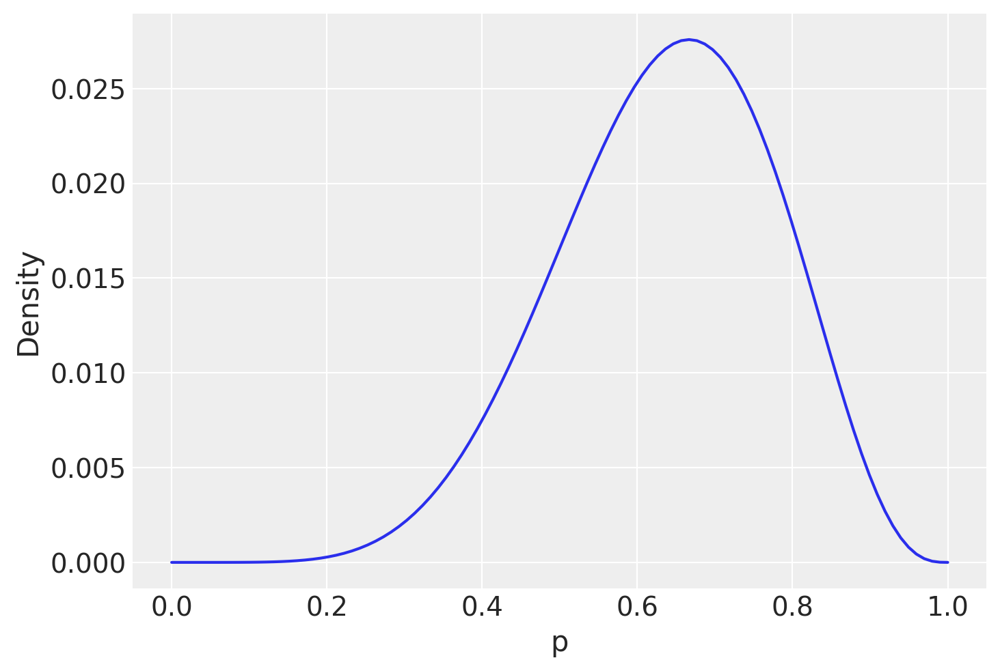

In [9]:
w, n = 6, 9
p_grid = np.linspace(0, 1, 100)
posterior = stats.binom.pmf(k=w, n=n, p=p_grid) * stats.uniform.pdf(p_grid, 0, 1)
posterior = posterior / (posterior).sum()
plt.plot(p_grid, posterior)
plt.xlabel("p")
plt.ylabel("Density");

#### Code 4.7 and 4.8

In [10]:
d = pd.read_csv("Data/Howell1.csv", sep=";", header=0)
d.head()

,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041915,41.0,1
4,145.415,41.276872,51.0,0


#### Code 4.9

In [11]:
az.summary(d.to_dict(orient="list"), kind="stats")

,mean,sd,hdi_5.5%,hdi_94.5%
height,138.264,27.602,90.805,170.180
weight,35.611,14.719,11.368,55.707
age,29.344,20.747,0.000,57.000
male,0.472,0.500,0.000,1.000


#### Code 4.10

In [12]:
d.height

0      151.765
1      139.700
2      136.525
3      156.845
4      145.415
        ...   
539    145.415
540    162.560
541    156.210
542     71.120
543    158.750
Name: height, Length: 544, dtype: float64

#### Code 4.11

In [13]:
d2 = d[d.age >= 18]

In [14]:
d2.shape

(352, 4)

#### Code 4.12

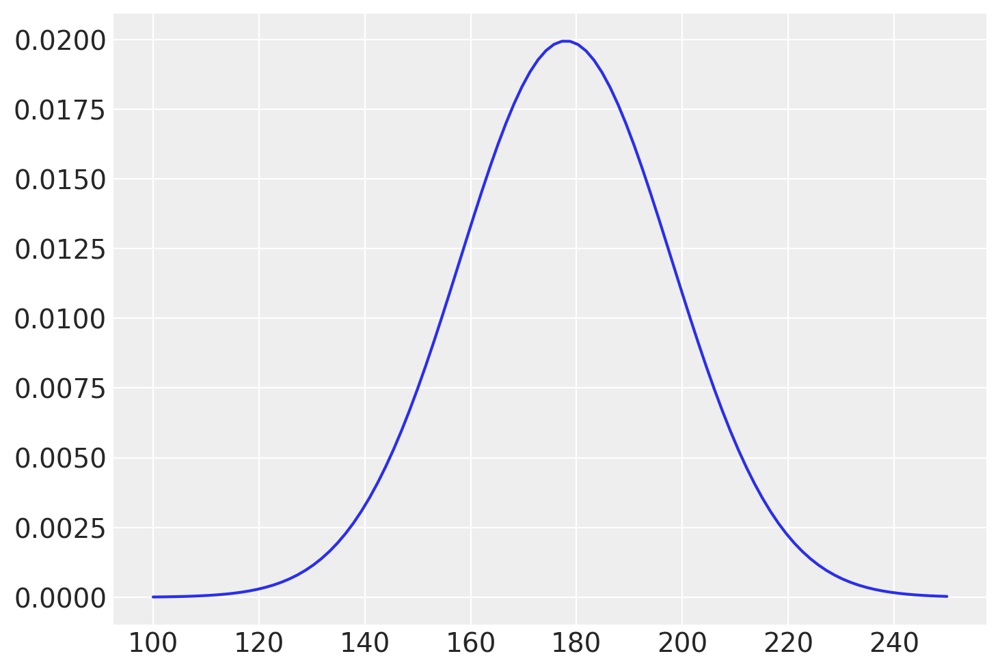

In [15]:
x = np.linspace(100, 250, 100)
plt.plot(x, stats.norm.pdf(x, 178, 20));

#### Code 4.13

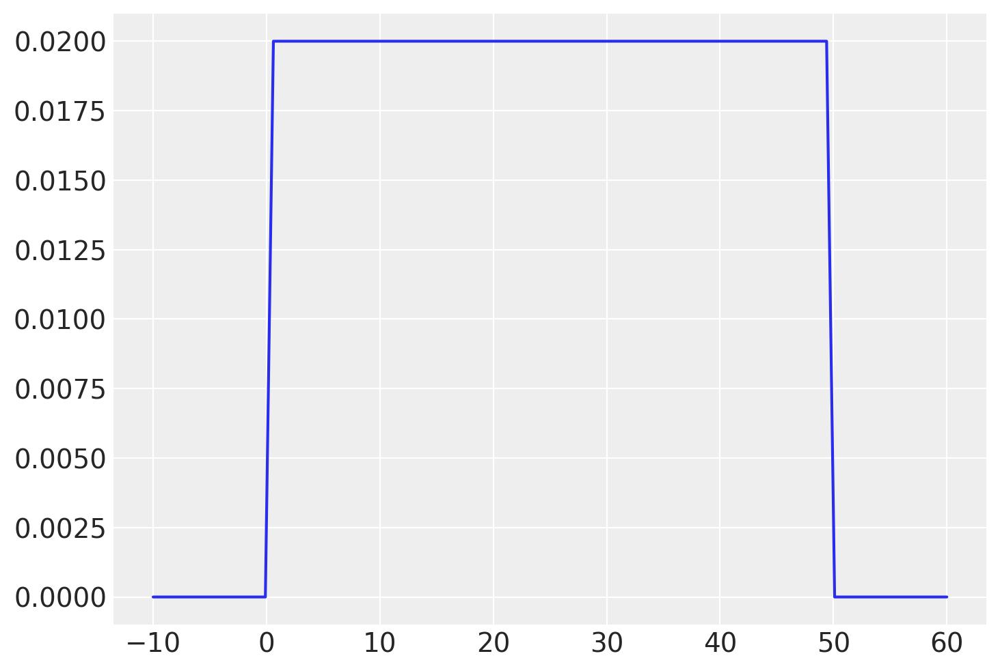

In [16]:
x = np.linspace(-10, 60, 100)
plt.plot(x, stats.uniform.pdf(x, 0, 50));

#### Code 4.14

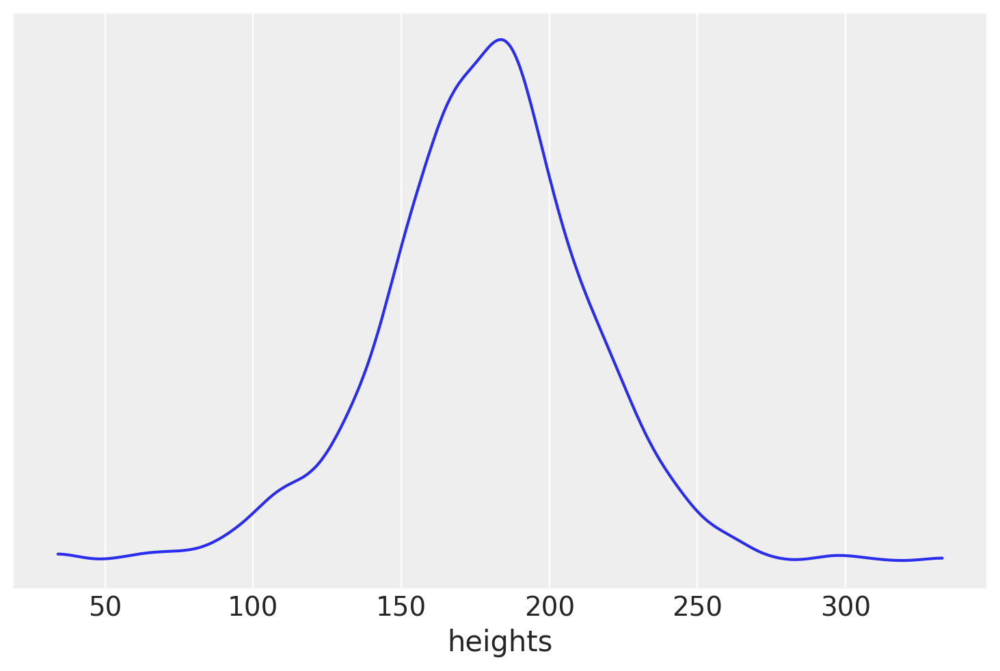

In [17]:
n_samples = 1000
sample_mu = stats.norm.rvs(loc=178, scale=20, size=n_samples)
sample_sigma = stats.uniform.rvs(loc=0, scale=50, size=n_samples)
prior_h = stats.norm.rvs(loc=sample_mu, scale=sample_sigma)
az.plot_kde(prior_h)
plt.xlabel("heights")
plt.yticks([]);

#### Code 4.15

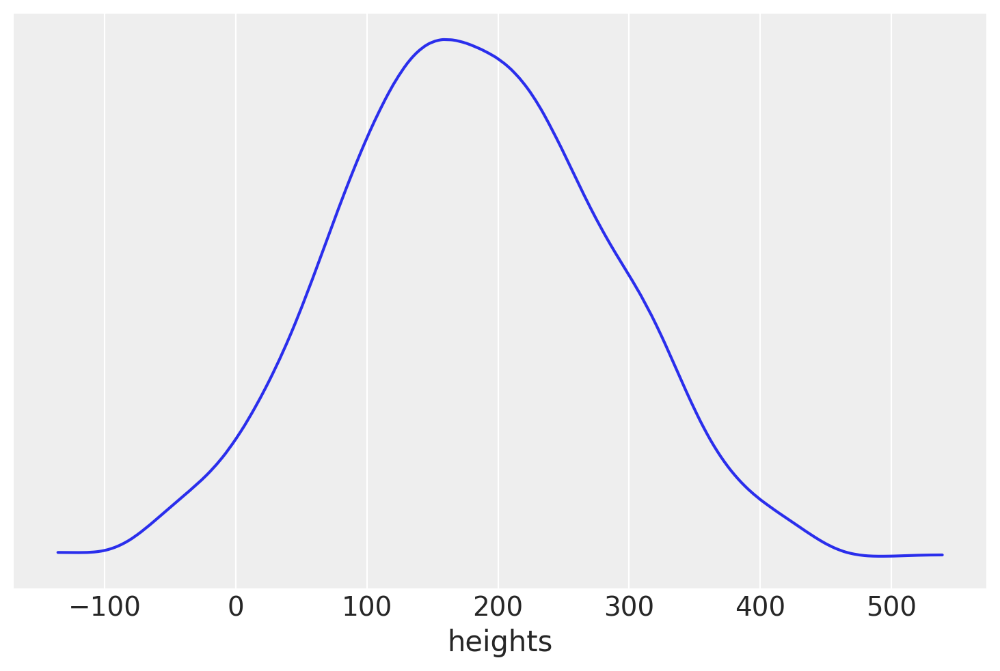

In [18]:
n_samples = 1000
sample_mu = stats.norm.rvs(loc=178, scale=100, size=n_samples)
prior_h = stats.norm.rvs(loc=sample_mu, scale=sample_sigma)
az.plot_kde(prior_h)
plt.xlabel("heights")
plt.yticks([]);

#### Code 4.16

In [19]:
post = np.mgrid[150:160:0.05, 7:9:0.05].reshape(2, -1).T

likelihood = [
    sum(stats.norm.logpdf(d2.height, loc=post[:, 0][i], scale=post[:, 1][i]))
    for i in range(len(post))
]

post_prod = (
    likelihood
    + stats.norm.logpdf(post[:, 0], loc=178, scale=20)
    + stats.uniform.logpdf(post[:, 1], loc=0, scale=50)
)
post_prob = np.exp(post_prod - max(post_prod))

#### Code 4.17

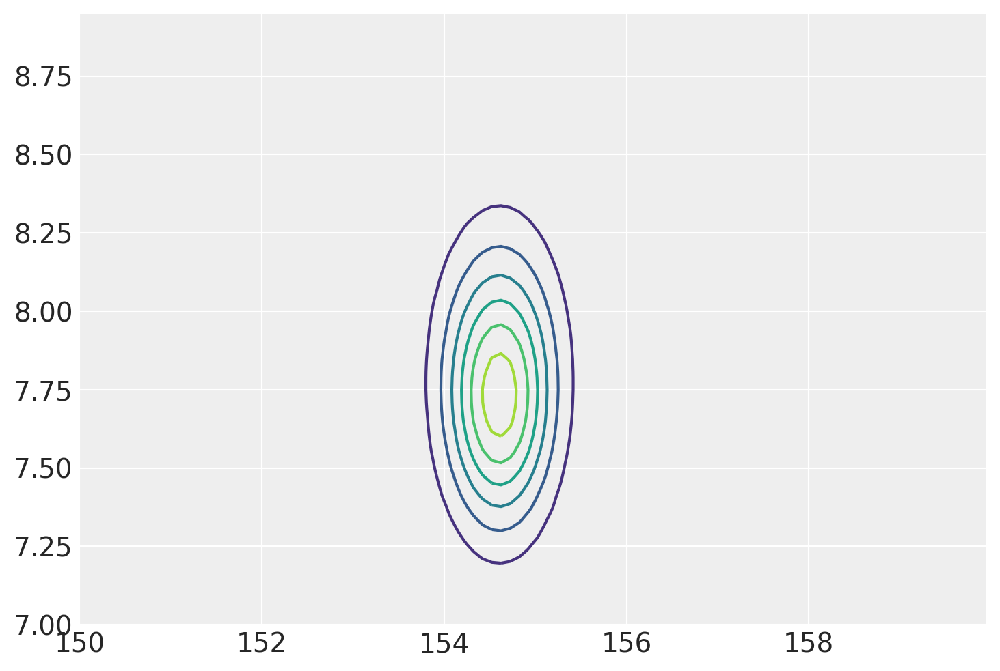

In [20]:
xi = np.linspace(post[:, 0].min(), post[:, 0].max(), 100)
yi = np.linspace(post[:, 1].min(), post[:, 1].max(), 100)
zi = griddata((post[:, 0], post[:, 1]), post_prob, (xi[None, :], yi[:, None]))

plt.contour(xi, yi, zi);

#### Code 4.18

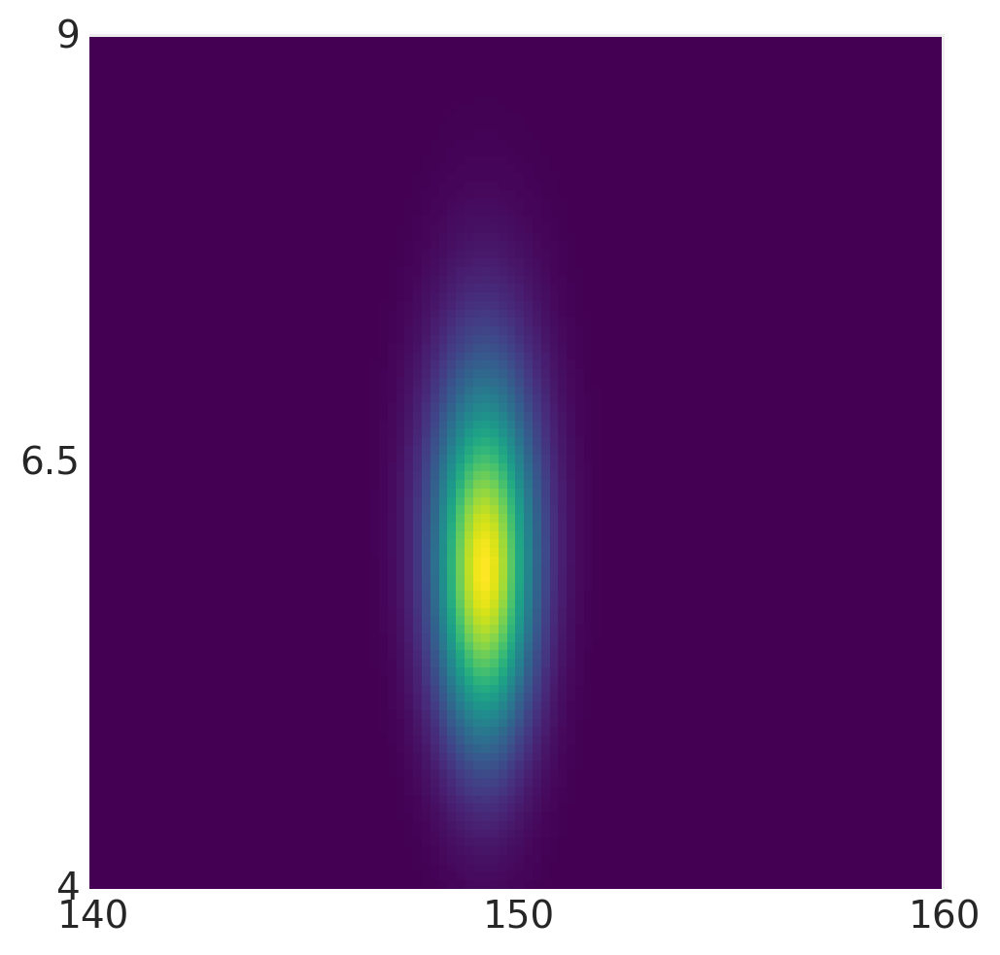

In [21]:
_, ax = plt.subplots()
ax.imshow(zi, origin="bottom")
ax.set_xticks([0, 50, 100])
ax.set_xticklabels([140, 150, 160])
ax.set_yticks([0, 50, 100])
ax.set_yticklabels([4, 6.5, 9])
ax.grid(False);

#### Code 4.19 and 4.20

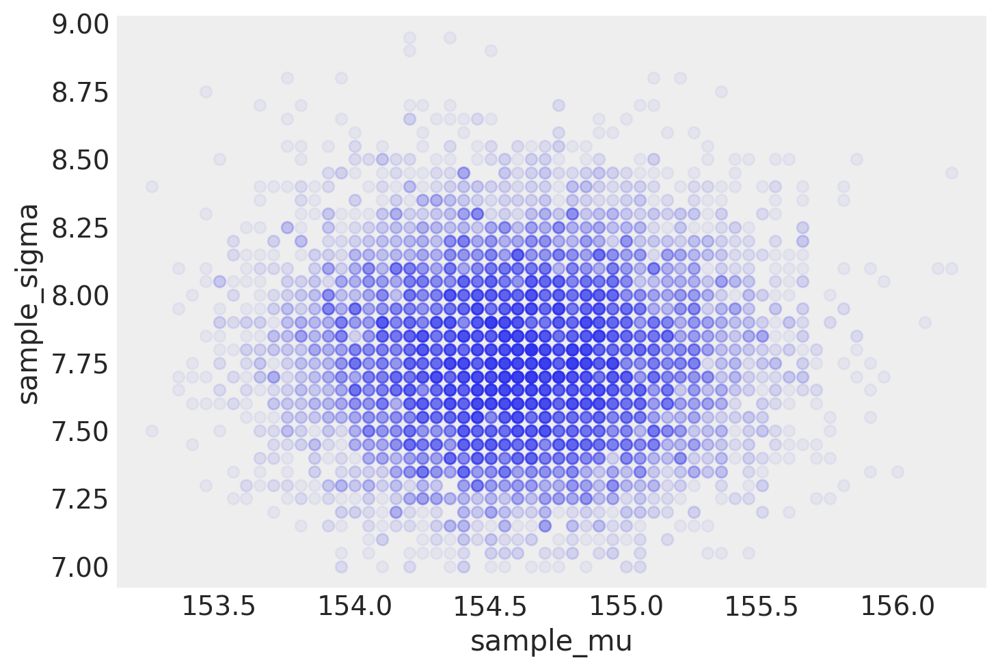

In [22]:
sample_rows = np.random.choice(
    np.arange(len(post)), size=10000, replace=True, p=(post_prob / post_prob.sum())
)
sample_mu = post[:, 0][sample_rows]
sample_sigma = post[:, 1][sample_rows]

plt.plot(sample_mu, sample_sigma, "o", alpha=0.05)
plt.axis("equal")
plt.grid(False)
plt.xlabel("sample_mu")
plt.ylabel("sample_sigma");

#### Code 4.21

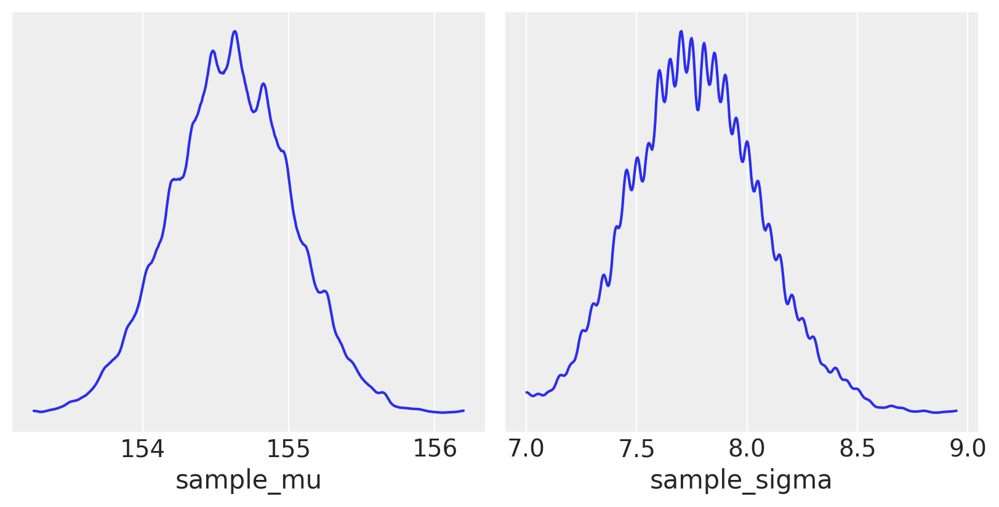

In [23]:
_, ax = plt.subplots(1, 2, figsize=(8, 4))
az.plot_kde(sample_mu, ax=ax[0])
ax[0].set_xlabel("sample_mu")
ax[0].set_yticks([])
az.plot_kde(sample_sigma, ax=ax[1])
ax[1].set_xlabel("sample_sigma")
ax[1].set_yticks([]);

#### Code 4.22

In [24]:
az.hpd(sample_mu), az.hpd(sample_sigma)

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:337: UserWarning: hpd will be deprecated Please replace hdi
  warnings.warn(("hpd will be deprecated " "Please replace hdi"),)


(array([153.9, 155.2]), array([7.3, 8.2]))

#### Code 4.23 and  4.24

In [25]:
d3 = np.random.choice(d2.height, 20)
post2 = np.mgrid[150:170:0.1, 4:20:0.1].reshape(2, -1).T

likelihood2 = [
    sum(stats.norm.logpdf(d3, loc=post2[:, 0][i], scale=post2[:, 1][i]))
    for i in range(len(post2))
]

post_prod2 = (
    likelihood2
    + stats.norm.logpdf(post2[:, 0], loc=178, scale=20)
    + stats.uniform.logpdf(post2[:, 1], loc=0, scale=50)
)

post_prob2 = np.exp(post_prod2 - max(post_prod2))

sample_rows2 = np.random.choice(
    np.arange(len(post2)), size=10000, replace=True, p=(post_prob2 / post_prob2.sum())
)
sample_mu2 = post2[:, 0][sample_rows2]
sample_sigma2 = post2[:, 1][sample_rows2]

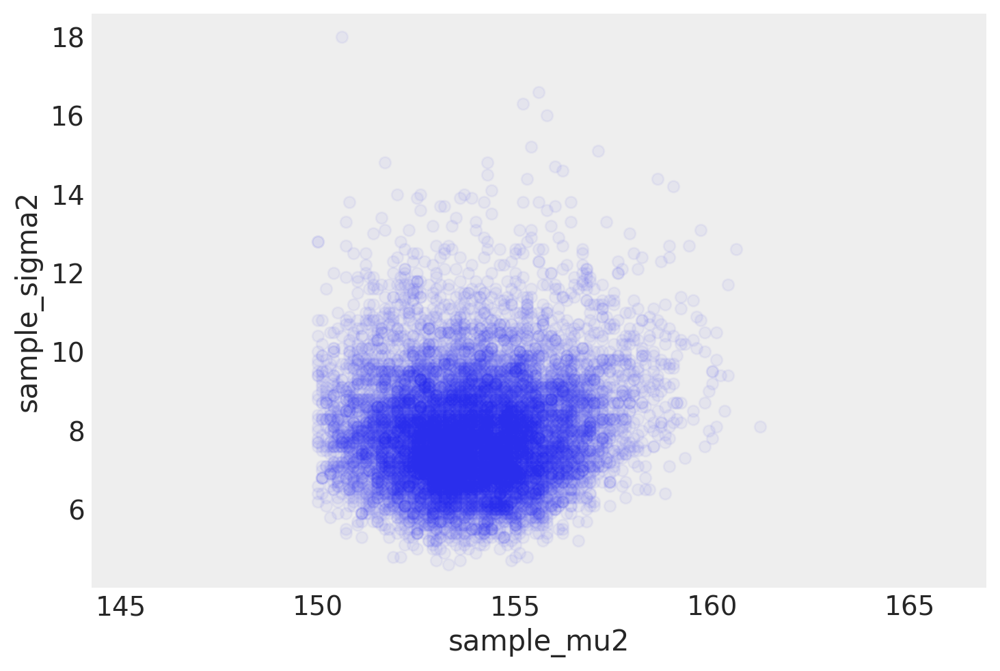

In [26]:
plt.plot(sample_mu2, sample_sigma2, "o", alpha=0.05)
plt.axis("equal")
plt.xlabel("sample_mu2")
plt.ylabel("sample_sigma2")
plt.grid(False);

#### Code 4.25

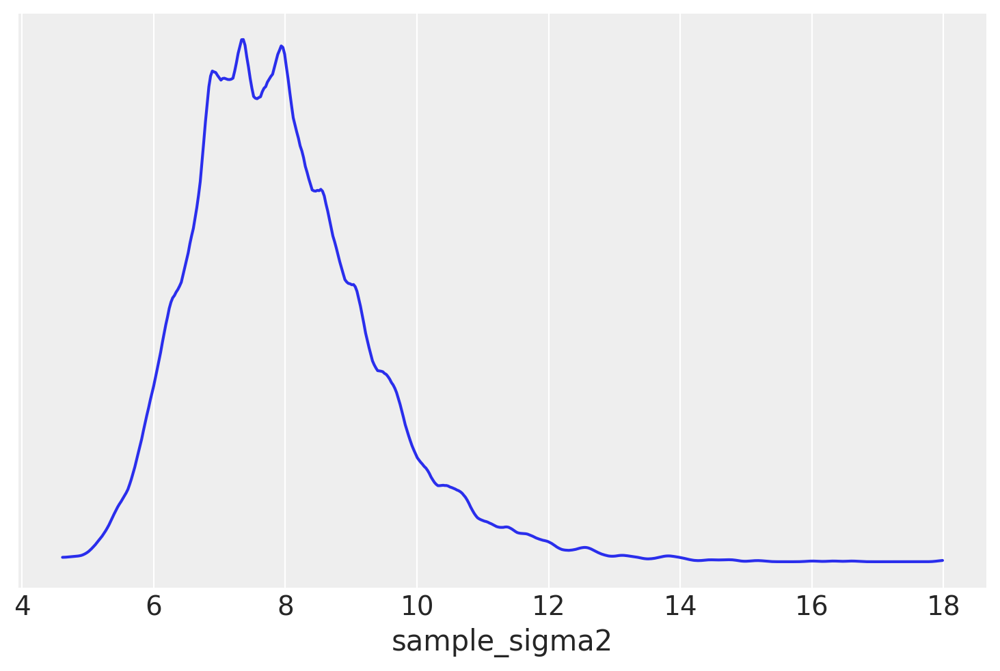

In [27]:
az.plot_kde(sample_sigma2)
plt.xlabel("sample_sigma2")
plt.yticks([]);

#### Code 4.26

We are repeating code 4.7, 4.8 and 4.10

In [28]:
d = pd.read_csv("Data/Howell1.csv", sep=";", header=0)
d2 = d[d.age >= 18]

#### Code 4.27

In [29]:
with pm.Model() as m4_1:
    mu = pm.Normal("mu", mu=178, sd=20)
    sigma = pm.Uniform("sigma", lower=0, upper=50)
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)

#### Code 4.28

We could use a quadratic approximation like McElreath does in his book and we did in code 2.6. But Using PyMC3 is really simple to just sample from the model using a "sampler method". Most common sampler methods are members of the Markov Chain Monte Carlo Method (MCMC) family (for details read Section 2.4.3 and Chapter 8 of Statistical Rethinking).

PyMC3 comes with various samplers. Some samplers are more suited than others for certain type of variable (and/or problems). For now we are going to let PyMC3 choose the sampler for us. PyMC3 also tries to provide a reasonable starting point for the simulation. By default PyMC3 uses the same adaptive procedure as in STAN `'jitter+adapt_diag'`, which starts with a identity mass matrix and then adapts a diagonal based on the variance of the tuning samples. 

You can read more details of PyMC3 [here](http://pymc-devs.github.io/pymc3/notebooks/getting_started.html)

In [30]:
with m4_1:
    trace_4_1 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, mu]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 16 seconds.


/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:87: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fdd315f36d0>,
      dtype=object)

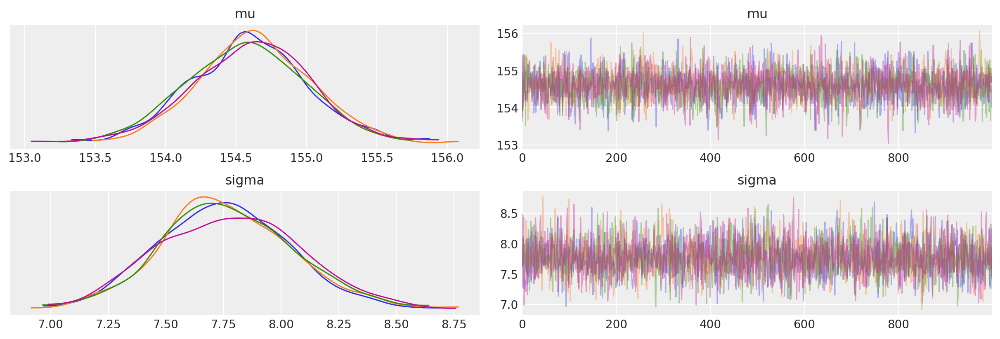

In [31]:
az.plot_trace(trace_4_1)
# this function lets you check the samples values

#### Code 4.29

In [32]:
az.summary(trace_4_1, round_to=2, kind="stats")

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:87: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
mu,154.60,0.42,153.93,155.26
sigma,7.77,0.29,7.27,8.21


#### Code 4.30

In [33]:
with pm.Model() as m4_1:
    mu = pm.Normal("mu", mu=178, sd=20, testval=d2.height.mean())
    sigma = pm.Uniform("sigma", lower=0, upper=50, testval=d2.height.std())
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)
    trace_4_1 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, mu]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 14 seconds.


#### Code 4.31

In [34]:
with pm.Model() as m4_2:
    mu = pm.Normal("mu", mu=178, sd=0.1)
    sigma = pm.Uniform("sigma", lower=0, upper=50)
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)
    trace_4_2 = pm.sample(1000, tune=1000)
az.summary(trace_4_2, round_to=2, kind="stats")

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, mu]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 14 seconds.
/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:87: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
mu,177.87,0.10,177.71,178.03
sigma,24.60,0.97,23.13,26.20


#### Code 4.32

For some computations could be nice to have the trace turned into a DataFrame, this can be done using the `trace_to_dataframe` function

In [35]:
trace_df = pm.trace_to_dataframe(trace_4_1)
trace_df.cov()

,mu,sigma
mu,0.174147,-0.000808
sigma,-0.000808,0.086675


#### Code 4.33

In [36]:
np.diag(trace_df.cov())

array([0.17414697, 0.08667545])

In [37]:
trace_df.corr()

,mu,sigma
mu,1.00000,-0.00658
sigma,-0.00658,1.00000


#### Code 4.34

We did not use the quadratic approximation, instead we use a MCMC method to sample from the posterior. Thus, we already have samples. We can do something like

In [38]:
trace_df.head()

,mu,sigma
0,154.448184,7.957034
1,154.403592,7.499977
2,154.296772,7.737786
3,154.499750,7.574812
4,154.798427,7.817021


Or directly from the trace (we are getting the first ten samples of _sigma_)

In [39]:
trace_4_1["sigma"][:10]

array([7.95703398, 7.49997702, 7.73778646, 7.57481201, 7.8170207 ,
       7.71536658, 7.54043389, 7.70533038, 7.56345078, 7.85467806])

#### Code 4.35

In our case, this is the same we did in the code 4.27

In [40]:
az.summary(trace_4_1, round_to=2, kind="stats")

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:87: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
mu,154.61,0.42,153.94,155.26
sigma,7.76,0.29,7.31,8.25


#### Code 4.36

In [41]:
stats.multivariate_normal.rvs(mean=trace_df.mean(), cov=trace_df.cov(), size=10)

array([[154.78622072,   7.80729901],
       [154.7905373 ,   8.19915248],
       [154.75286531,   7.38424058],
       [154.27518669,   7.69996386],
       [155.34582629,   7.77696909],
       [154.8975967 ,   7.29400849],
       [154.53953586,   7.77001742],
       [154.29148998,   7.90449442],
       [154.32744169,   7.44754327],
       [154.27462184,   7.27289249]])

#### Code 4.37

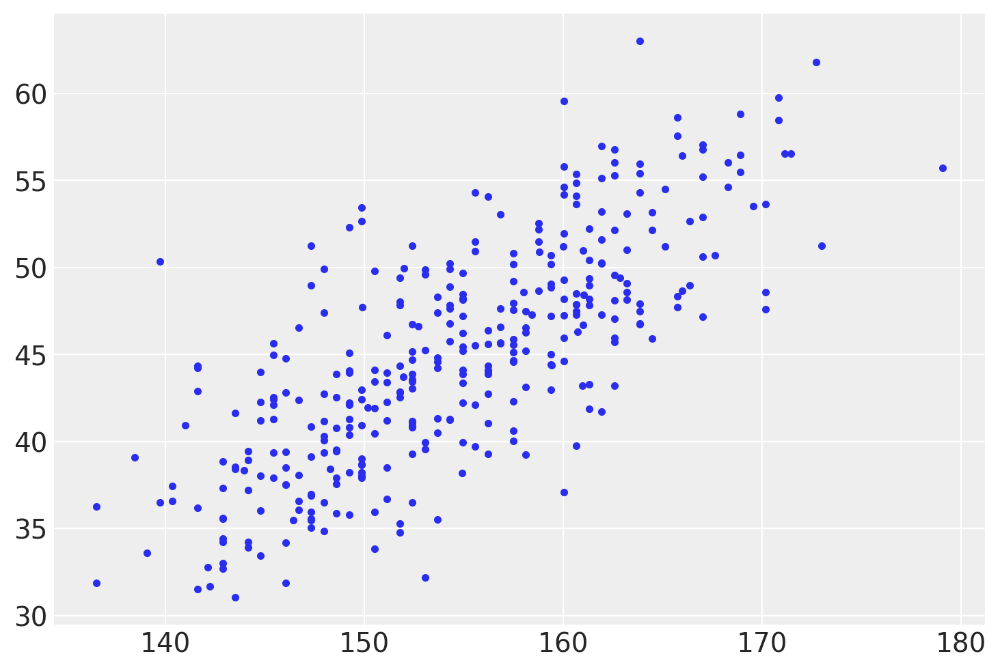

In [42]:
plt.plot(d2.height, d2.weight, ".");

### Linear model

$h_i \sim N(\mu_i , \sigma)$

$\mu_i = \alpha + \beta(x_i - \overline{x})$

$\alpha \sim N(178, 20)$

$\beta \sim N(0, 10)$

$\sigma \sim U(0, 50)$

#### Code 4.38

In [43]:
np.random.seed(2971)
N = 100  # 100 lines
a = stats.norm.rvs(178, 20, N)
b = stats.norm.rvs(0, 10, N)

#### Code 4.39 and 4.40

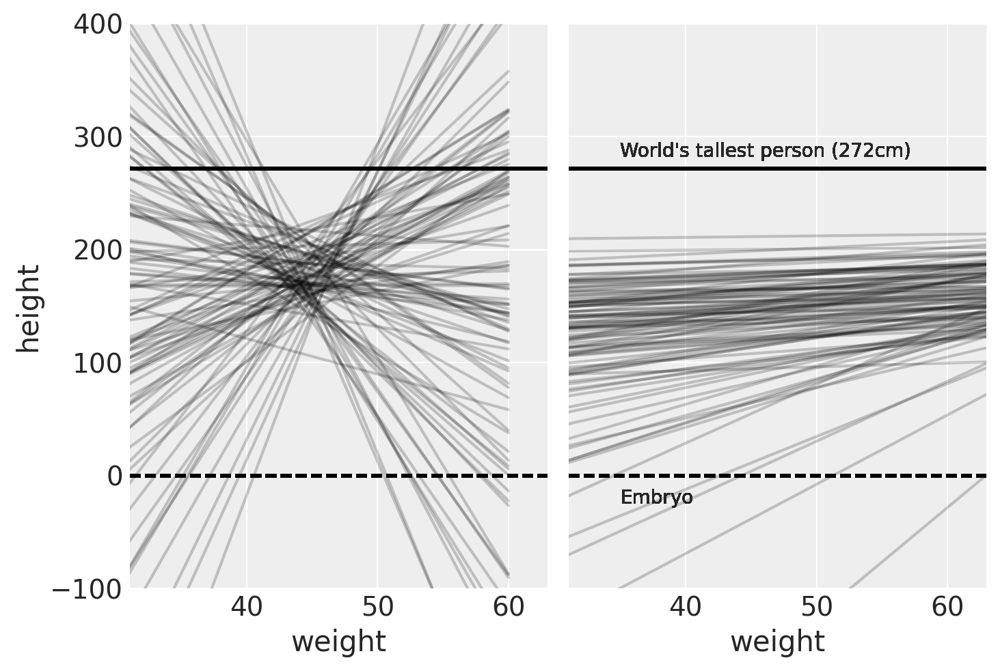

In [44]:
_, ax = plt.subplots(1, 2, sharey=True)
xbar = d2.weight.mean()
for i in range(N):
    ax[0].plot(x, a[i] + b[i] * (x - xbar), "k", alpha=0.2)
    ax[0].set_xlim(d2.weight.min(), d2.weight.max())
    ax[0].set_ylim(-100, 400)
    ax[0].axhline(0, c="k", ls="--")
    ax[0].axhline(272, c="k")
    ax[0].set_xlabel("weight")
    ax[0].set_ylabel("height")

b = stats.lognorm.rvs(s=1, scale=1, size=100)
for i in range(N):
    ax[1].plot(a[i] + b[i] * (x - xbar), "k", alpha=0.2)
    ax[1].set_xlim(d2.weight.min(), d2.weight.max())
    ax[1].set_ylim(-100, 400)
    ax[1].axhline(0, c="k", ls="--", label="embryo")
    ax[1].axhline(272, c="k")
    ax[1].set_xlabel("weight")
    ax[1].text(x=35, y=282, s="World's tallest person (272cm)")
    ax[1].text(x=35, y=-25, s="Embryo");

#### Code 4.42

In [45]:
with pm.Model() as m4_3:
    a = pm.Normal("a", mu=178, sd=20)
    b = pm.Lognormal("b", mu=0, sd=1)
    sigma = pm.Uniform("sigma", 0, 50)
    mu = a + b * (d2.weight - xbar)
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)
    trace_4_3 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 12 seconds.


In [46]:
with pm.Model() as m4_3b:
    a = pm.Normal("a", mu=178, sd=20)
    b = pm.Normal("b", mu=0, sd=1)
    sigma = pm.Uniform("sigma", 0, 50)
    mu = a + np.exp(b) * (d2.weight - xbar)
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)
    trace_4_3b = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 13 seconds.


#### Code 4.44

In [47]:
az.summary(trace_4_3, kind="stats")

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:87: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
a,154.601,0.279,154.183,155.068
b,0.903,0.043,0.838,0.974
sigma,5.101,0.197,4.758,5.386


#### Code 4.45

In [48]:
trace_4_3_df = pm.trace_to_dataframe(trace_4_3)
trace_4_3_df.cov().round(3)

,a,b,sigma
a,0.078,0.000,-0.001
b,0.000,0.002,0.000
sigma,-0.001,0.000,0.039


#### Code 4.46

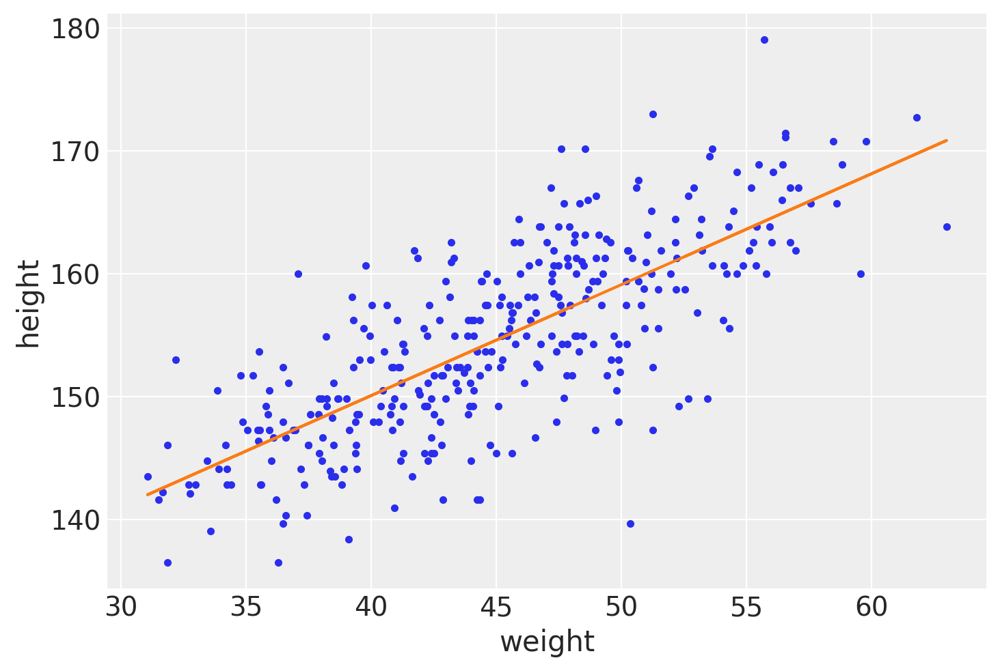

In [49]:
plt.plot(d2.weight, d2.height, ".")
plt.plot(d2.weight, trace_4_3["a"].mean() + trace_4_3["b"].mean() * (d2.weight - xbar))
plt.xlabel(d2.columns[1])
plt.ylabel(d2.columns[0]);

#### Code 4.47

In [50]:
trace_4_3_df.head(5)

,a,b,sigma
0,154.877888,0.876034,5.585544
1,154.459577,0.985210,5.247127
2,154.669450,0.842755,4.812592
3,154.563667,0.841997,4.844274
4,154.807251,0.934281,5.493734


#### Code 4.48

In [51]:
N = [10, 50, 150, 352][3]
dN = d2[:N]
with pm.Model() as m_N:
    a = pm.Normal("a", mu=178, sd=100)
    b = pm.Lognormal("b", mu=0, sd=1)
    sigma = pm.Uniform("sigma", 0, 50)
    mu = pm.Deterministic("mu", a + b * (dN.weight - dN.weight.mean()))
    height = pm.Normal("height", mu=mu, sd=sigma, observed=dN.height)
    trace_N = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 14 seconds.


#### Code 4.49

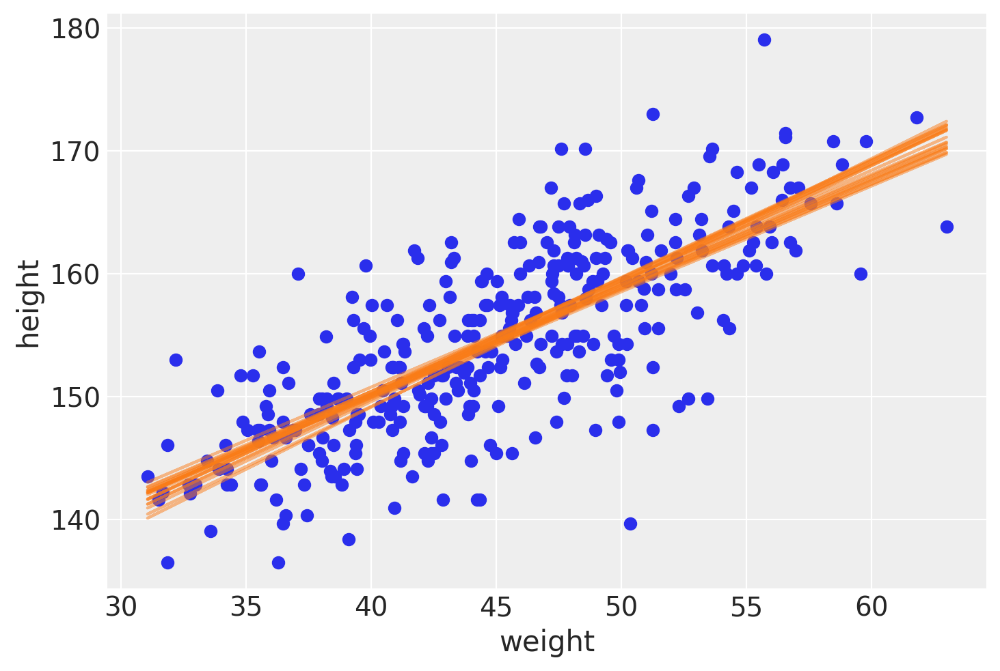

In [52]:
plt.plot(dN.weight, dN.height, "C0o")
idxs = np.random.randint(len(trace_N), size=20)
for idx in idxs:
    plt.plot(
        dN.weight,
        trace_N["a"][idx] + trace_N["b"][idx] * (dN.weight - dN.weight.mean()),
        "C1-",
        alpha=0.5,
    )
plt.xlabel(d2.columns[1])
plt.ylabel(d2.columns[0]);

Alternative we can directly use the deterministic `mu` variable

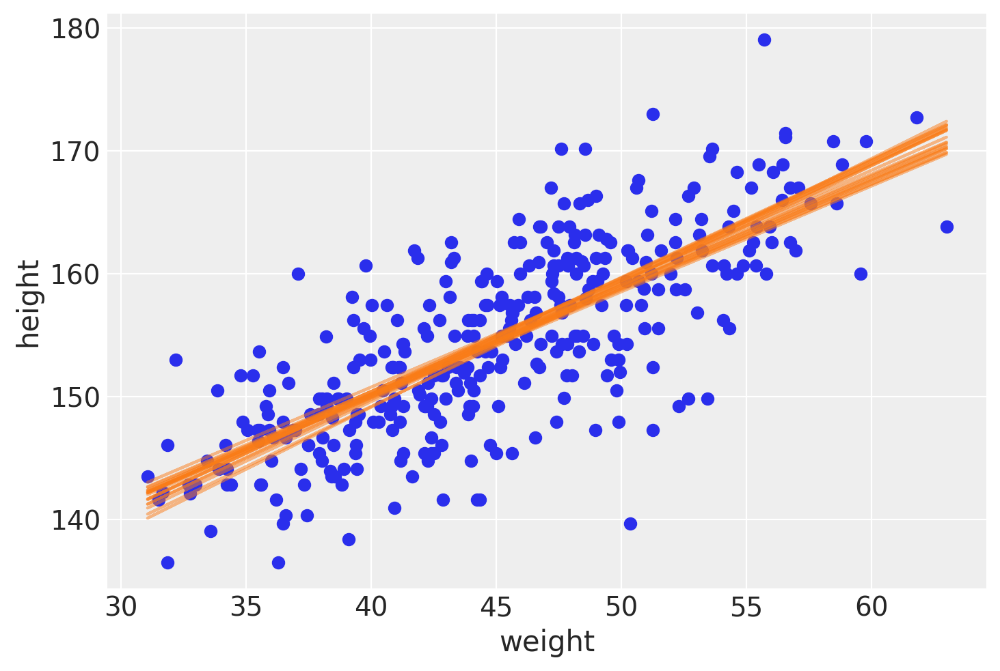

In [53]:
plt.plot(dN.weight, dN.height, "C0o")
for idx in idxs:
    plt.plot(d2.weight[:N], trace_N["mu"][idx], "C1-", alpha=0.5)
plt.xlabel(d2.columns[1])
plt.ylabel(d2.columns[0]);

#### Code 4.50

In [54]:
mu_at_50 = trace_4_3["a"] + trace_4_3["b"] * (50 - d2.weight.mean())

#### Code 4.51

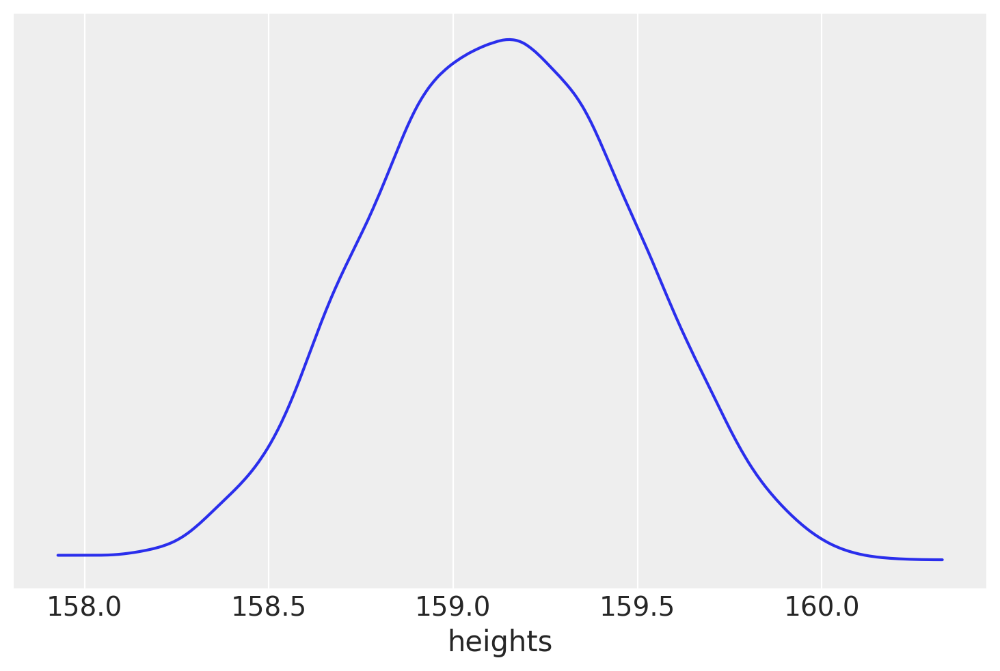

In [55]:
az.plot_kde(mu_at_50)
plt.xlabel("heights")
plt.yticks([]);

#### Code 4.52

In [56]:
az.hdi(mu_at_50)

array([158.60337296, 159.71023254])

#### Code 4.53 and 4.54

We are doing _manually_, in the book is done using the ```link``` function. In the book on code 4.58 the following operations are performed _manually_.

In [57]:
weight_seq = np.arange(25, 71)
# Given that we have a lot of samples we can use less of them for plotting (or we can use all!)
trace_4_3_thinned = trace_4_3[::10]
mu_pred = np.zeros((len(weight_seq), len(trace_4_3_thinned) * trace_4_3.nchains))
for i, w in enumerate(weight_seq):
    mu_pred[i] = trace_4_3_thinned["a"] + trace_4_3_thinned["b"] * (
        w - d2.weight.mean()
    )

#### Code 4.55

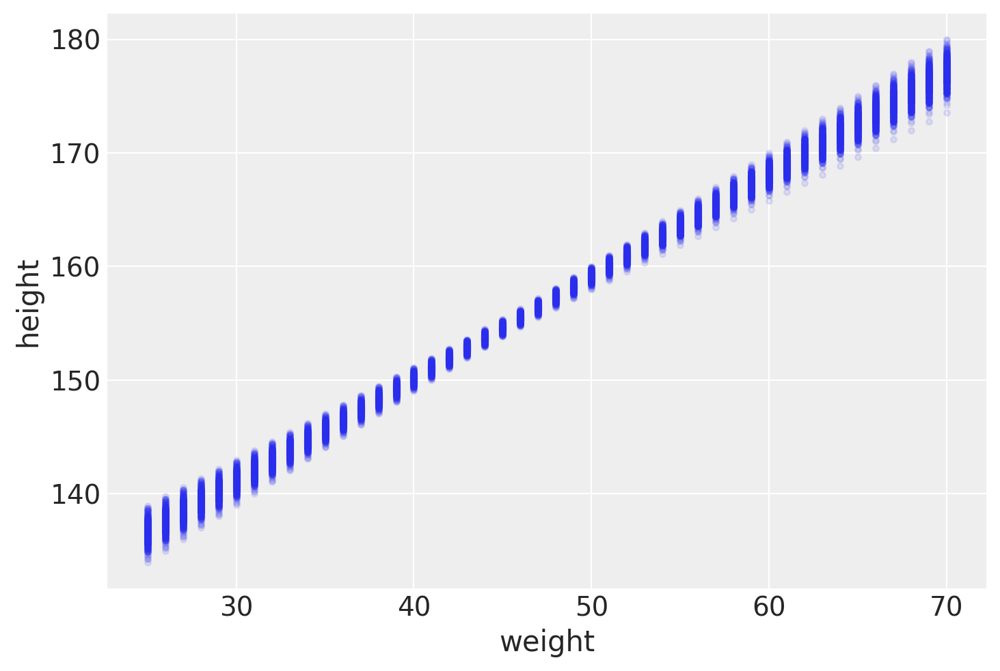

In [58]:
plt.plot(weight_seq, mu_pred, "C0.", alpha=0.1)
plt.xlabel("weight")
plt.ylabel("height");

#### Code 4.56

In [59]:
mu_mean = mu_pred.mean(1)
mu_hpd = az.hpd(mu_pred.T)

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:337: UserWarning: hpd will be deprecated Please replace hdi
  warnings.warn(("hpd will be deprecated " "Please replace hdi"),)
/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


#### Code 4.57

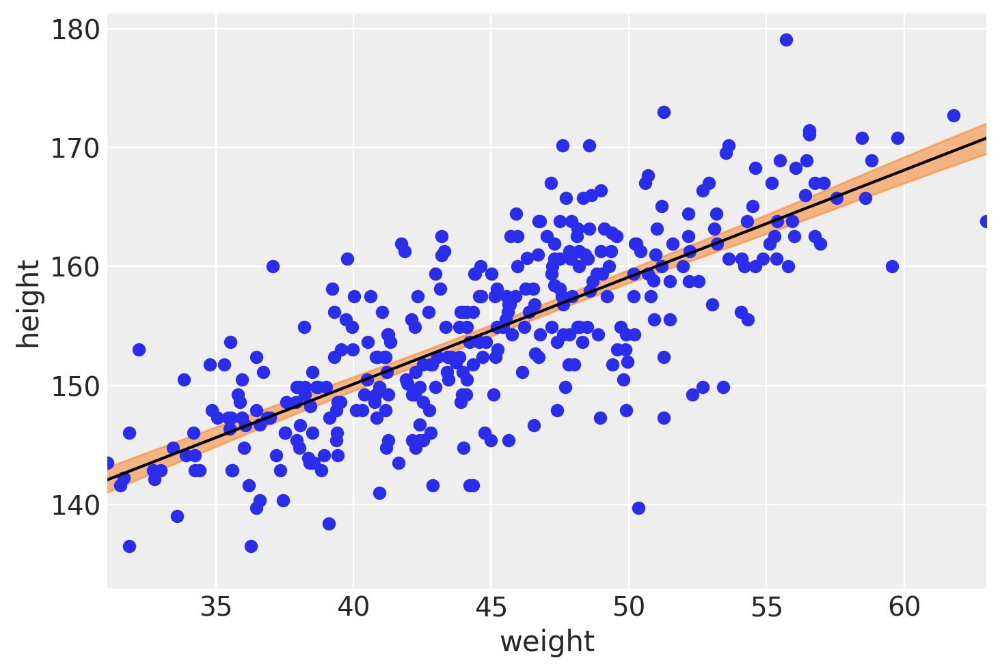

In [60]:
az.plot_hpd(weight_seq, mu_pred.T)
plt.plot(weight_seq, mu_mean, "k")
plt.scatter(d2.weight, d2.height)
plt.xlabel("weight")
plt.ylabel("height")
plt.xlim(d2.weight.min(), d2.weight.max());

_Conditional on the assumption that height and weight are related by a straight line, then this is the most plausible line, and these are its plausible bonds._

#### Code 4.59

Now we are going to use ```sample_posterior_predictive()``` from PyCM3. This function gives us posterior predictive samples, that is for each value of the input variable we get a sample (from the posterior) of the output variable. Thus in the following example the shape of `height_pred['height'].shape is (200, 352)`

In [61]:
height_pred = pm.sample_posterior_predictive(trace_4_3, 200, m4_3)

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/pymc3/sampling.py:1707: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


#### Code 4.60

In [62]:
height_pred_hpd = az.hpd(height_pred["height"])

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:337: UserWarning: hpd will be deprecated Please replace hdi
  warnings.warn(("hpd will be deprecated " "Please replace hdi"),)
/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


#### Code 4.61

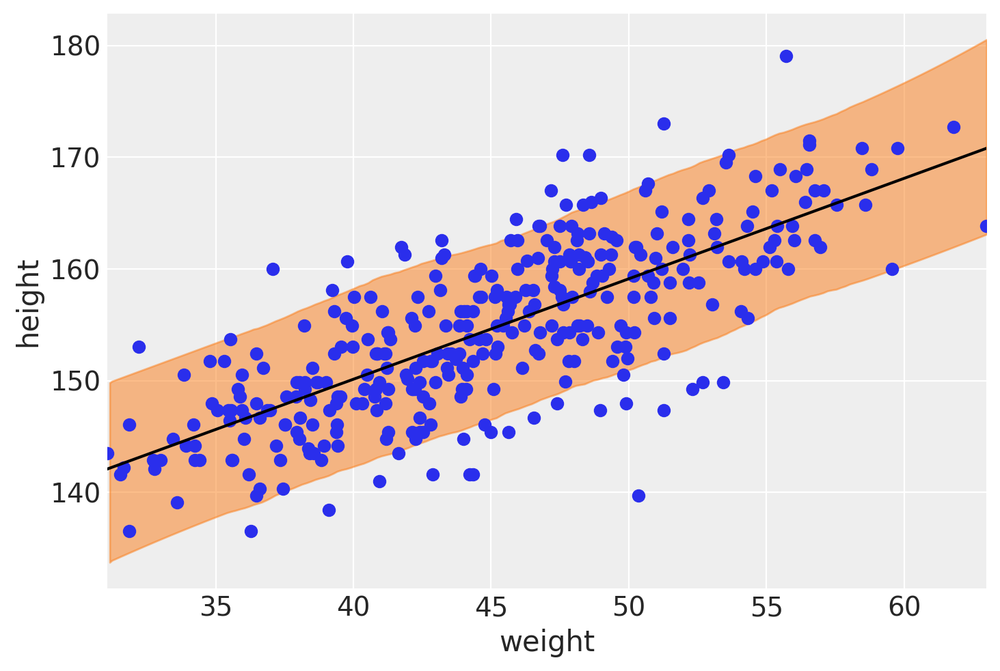

In [63]:
# az.plot_hpd(weight_seq, mu_pred.T)
az.plot_hpd(d2.weight, height_pred["height"])
plt.scatter(d2.weight, d2.height)
plt.plot(weight_seq, mu_mean, "k")
plt.xlabel("weight")
plt.ylabel("height")
plt.xlim(d2.weight.min(), d2.weight.max());

#### Code 4.62

Change the number of samples used in 4.59 (200) to other values.

#### Code 4.63

Now we are going to generate heights from the posterior *manually*. Instead of restricting ourselves to the input values, we are going to pass an array of equally spaced weights values, called `weight_seg`.

In [64]:
weight_seq = np.arange(25, 71)
post_samples = []
for _ in range(1000):  # number of samples from the posterior
    i = np.random.randint(len(trace_4_3))
    mu_pr = trace_4_3["a"][i] + trace_4_3["b"][i] * (weight_seq - d2.weight.mean())
    sigma_pred = trace_4_3["sigma"][i]
    post_samples.append(np.random.normal(mu_pr, sigma_pred))

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


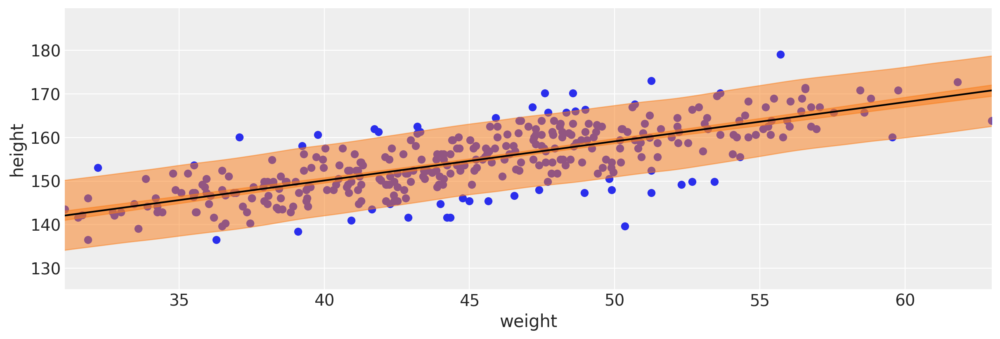

In [65]:
fig, ax = plt.subplots(1, 1, figsize=(12, 4))

ax.scatter(d2.weight, d2.height)
ax.plot(weight_seq, mu_mean, "k")
az.plot_hpd(weight_seq, mu_pred.T, ax=ax)
az.plot_hpd(weight_seq, np.array(post_samples), ax=ax)
ax.set_xlabel("weight")
ax.set_ylabel("height")
ax.set_xlim(d2.weight.min(), d2.weight.max());

#### Code 4.64

We have already loaded this dataset, check code 4.7 and 4.8.

In [66]:
d.head()

,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041915,41.0,1
4,145.415,41.276872,51.0,0


#### Code 4.65

No non-negative prior for polynominal parameter.

In [67]:
d["weight_std"] = (d.weight - d.weight.mean()) / d.weight.std()
d["weight_std2"] = d.weight_std ** 2

with pm.Model() as m_4_5:
    a = pm.Normal("a", mu=178, sd=100)
    b1 = pm.Lognormal("b1", mu=0, sd=1)
    b2 = pm.Normal("b2", mu=0, sd=1)
    sigma = pm.Uniform("sigma", lower=0, upper=50)
    mu = pm.Deterministic("mu", a + b1 * d.weight_std + b2 * d.weight_std2)
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d.height)
    trace_4_5 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b2, b1, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 15 seconds.


/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:87: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


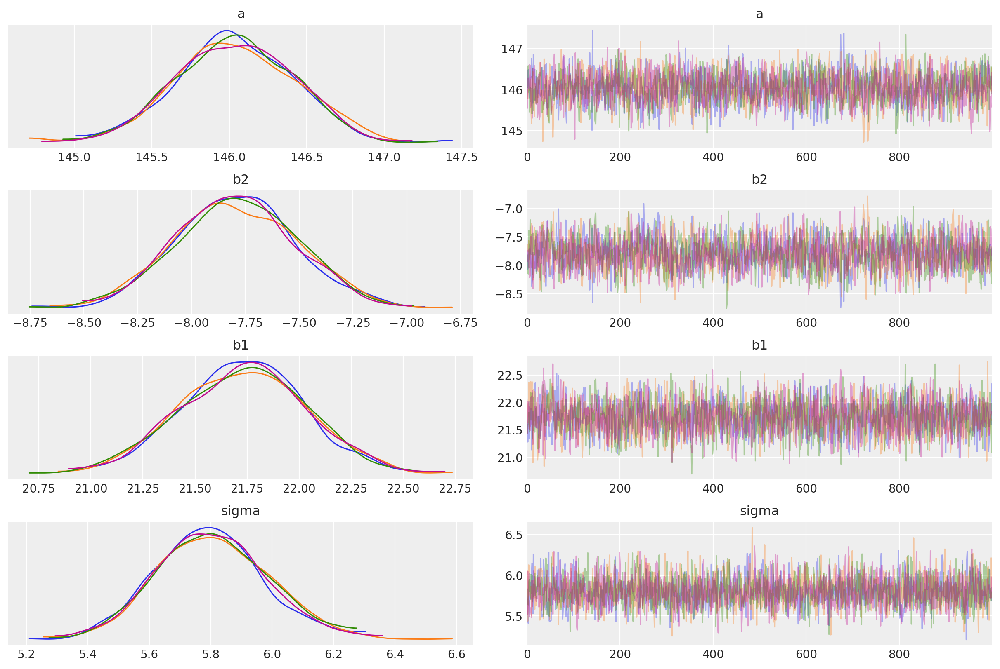

In [68]:
varnames = ["~mu"]
az.plot_trace(trace_4_5, varnames);

#### Code 4.66

In [69]:
az.summary(trace_4_5, varnames, kind="stats", round_to=2)

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:87: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
a,146.04,0.38,145.45,146.64
b2,-7.79,0.28,-8.24,-7.35
b1,21.73,0.30,21.23,22.19
sigma,5.80,0.18,5.51,6.08


#### Code 4.67

In [70]:
mu_pred = trace_4_5["mu"]
height_pred = pm.sample_posterior_predictive(trace_4_5, 200, m_4_5)

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/pymc3/sampling.py:1707: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


#### Code 4.68

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


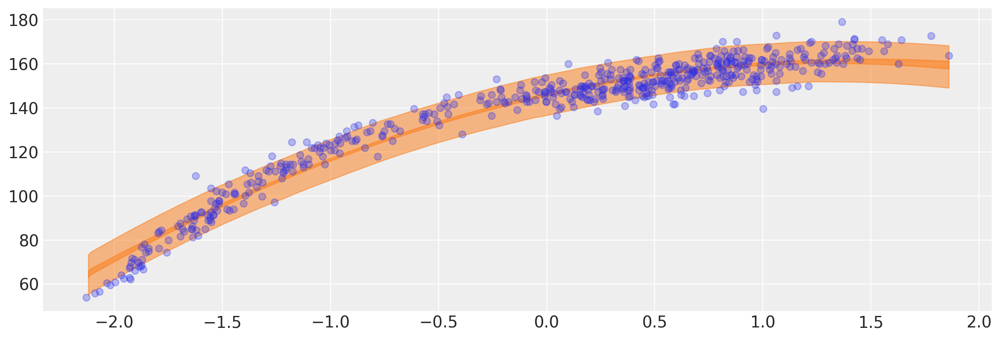

In [71]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))

az.plot_hpd(d.weight_std, height_pred["height"], ax=ax)
az.plot_hpd(d.weight_std, mu_pred, ax=ax)
ax.scatter(d.weight_std, d.height, c="C0", alpha=0.3);

#### Code 4.69

We will stack the weights to get a 2D array, these simplifies wrriting a model. Now we can compute the dot product between beta and the 2D-array

In [72]:
weight_m = np.vstack((d.weight_std, d.weight_std ** 2, d.weight_std ** 3))

In [73]:
with pm.Model() as m_4_6:
    a = pm.Normal("a", mu=178, sd=100)
    b = pm.Normal("b", mu=0, sd=10, shape=3)
    sigma = pm.Uniform("sigma", lower=0, upper=50)
    mu = pm.Deterministic("mu", a + pm.math.dot(b, weight_m))
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d.height)
    trace_4_6 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 13 seconds.


#### Code 4.70 and 4.71

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/pymc3/sampling.py:1707: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


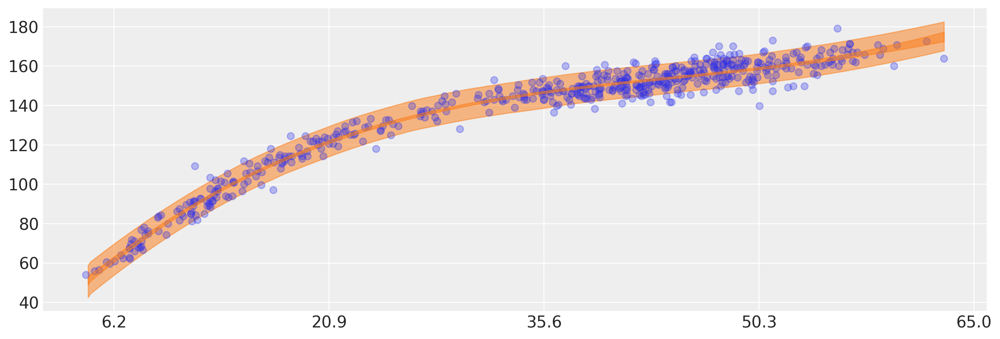

In [74]:
mu_pred = trace_4_6["mu"]
height_pred = pm.sample_posterior_predictive(trace_4_6, 200, m_4_6)

_, ax = plt.subplots(1, 1, figsize=(12, 4))
az.plot_hpd(d.weight_std, height_pred["height"], ax=ax)
ax.scatter(d.weight_std, d.height, c="C0", alpha=0.3)
az.plot_hpd(d.weight_std, mu_pred, ax=ax)

at = np.arange(-2, 3)
plt.xticks(at, np.round(at * d.weight.std() + d.weight.mean(), 1));

The model is linear in terms of parameters.

#### Code 4.72

In [75]:
d = pd.read_csv("Data/cherry_blossoms.csv")
# nans are not treated as in the book
az.summary(d.dropna().to_dict(orient="list"), kind="stats")

,mean,sd,hdi_5.5%,hdi_94.5%
year,1533.395,291.123,1123.00,1978.00
doy,104.921,6.258,95.00,114.00
temp,6.100,0.683,5.00,7.13
temp_upper,6.938,0.812,5.57,7.98
temp_lower,5.264,0.762,4.12,6.40


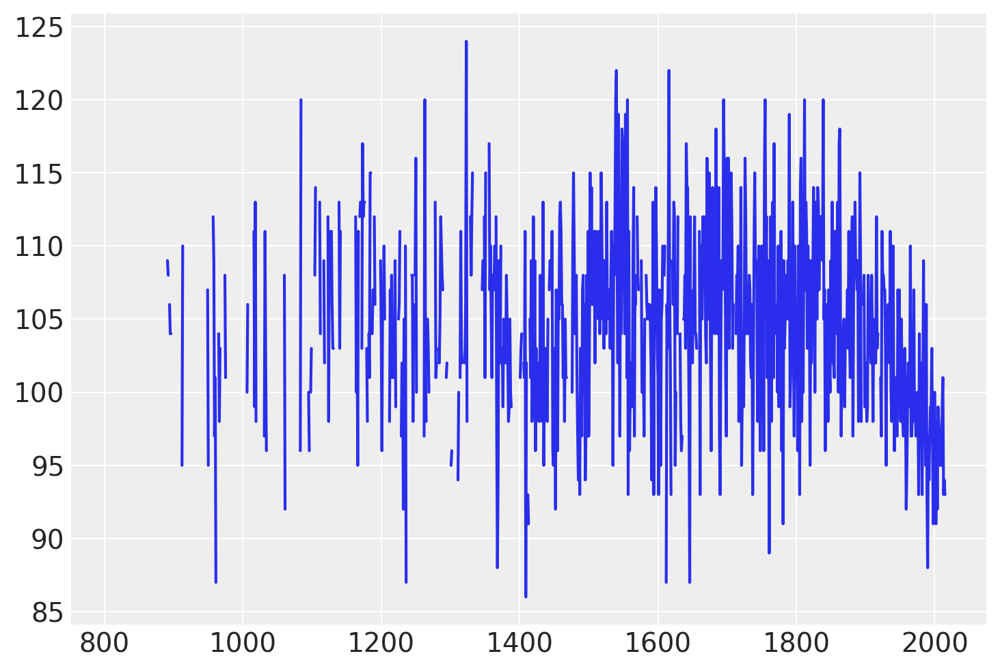

In [76]:
plt.plot(d.year, d.doy);

#### Code 4.73

In [77]:
d2 = d.dropna(subset=["doy"])
num_knots = 15
knot_list = np.quantile(d2.year, np.linspace(0, 1, num_knots))

#### Code 4.74

Here we will use patsy as a simple way of building the b-spline matrix. For more detail please read https://patsy.readthedocs.io/en/latest/spline-regression.html

In [78]:
from patsy import dmatrix

B = dmatrix(
    "bs(year, knots=knots, degree=3, include_intercept=True) - 1",
    {"year": d2.year.values, "knots": knot_list[1:-1]},
)

#### Code 4.75

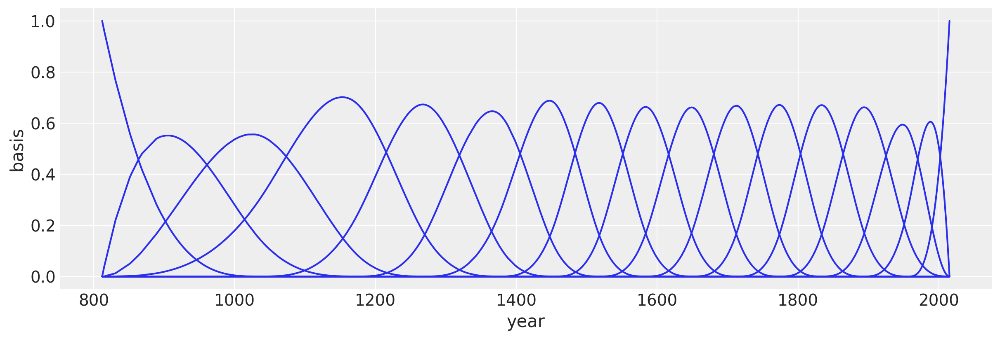

In [79]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))
for i in range(17):
    ax.plot(d2.year, (B[:, i]), color="C0")
ax.set_xlabel("year")
ax.set_ylabel("basis");

#### Code 4.76

Note: if the mode gets stall instead of sampling try replacing `mu = pm.Deterministic("mu", a + pm.math.dot(B.base, w.T))` with `mu = pm.Deterministic("mu", a + pm.math.dot(np.asarray(B, order="F"), w.T))`

In [80]:
with pm.Model() as m4_7:
    a = pm.Normal("a", 100, 10)
    w = pm.Normal("w", mu=0, sd=10, shape=B.shape[1])
    mu = pm.Deterministic("mu", a + pm.math.dot(np.asarray(B, order="F"), w.T))
    # mu = pm.Deterministic("mu", a + pm.math.dot(B.base, w.T))
    sigma = pm.Exponential("sigma", 1)
    D = pm.Normal("D", mu, sigma, observed=d2.doy)
    trace_m4_7 = pm.sample(1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, w, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 23 seconds.
The number of effective samples is smaller than 25% for some parameters.


#### Code 4.77

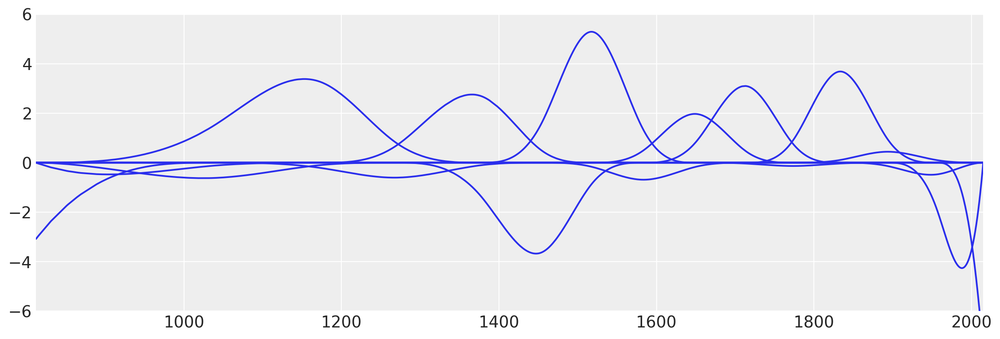

In [81]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))
wp = trace_m4_7[w].mean(0)
for i in range(17):
    ax.plot(d2.year, (wp[i] * B[:, i]), color="C0")
ax.set_xlim(812, 2015)
ax.set_ylim(-6, 6);

#### Code 4.78

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


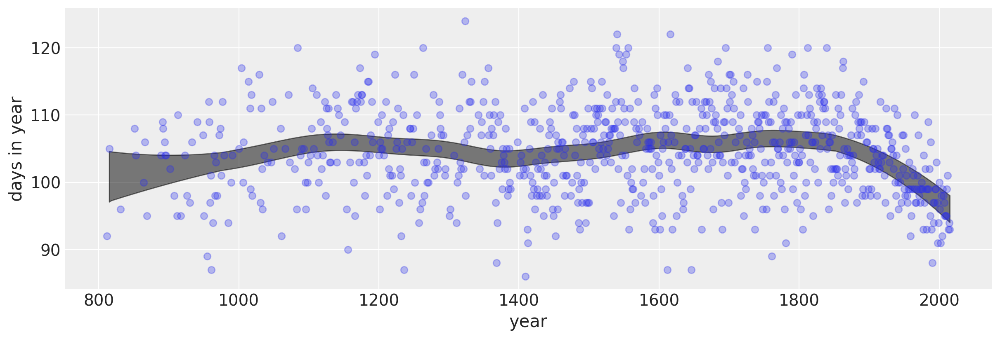

In [82]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))

ax.plot(d2.year, d2.doy, "o", alpha=0.3)
az.plot_hpd(d2.year, trace_m4_7["mu"], color="k", ax=ax)
ax.set_xlabel("year")
ax.set_ylabel("days in year");

### Practice

#### 4E1

The first one - $y_i \sim N(\mu, \sigma)$

#### 4E2

2 parameters

#### 4E3

$$Pr(\mu, \sigma| y_i) = \frac{\prod_i N(y_i | \mu, \sigma) N(\mu| 0, 10) Exp(\sigma| 1)} 
{\iint \prod_i N(y_i | \mu, \sigma) N(\mu| 0, 10) Exp(\sigma| 1) d\mu d\sigma}$$

#### 4E4

The second one $\mu_i = \alpha + \beta x_i$

#### 4E5

3 parameters

#### 4M1

In [83]:
np.random.seed(2971)
N = 100  # 100 lines
mu = stats.norm.rvs(0, 10, N)
sigma = stats.expon.rvs(1, N)
y = stats.norm.rvs(mu, sigma, N)

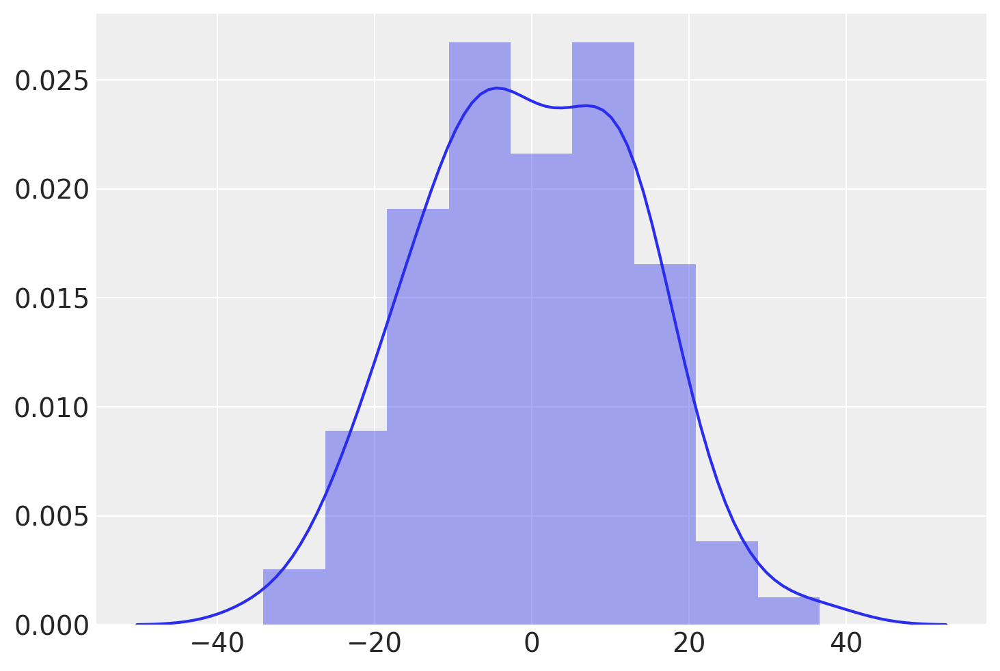

In [84]:
sns.distplot(y);

#### 4M2

In [85]:
with pm.Model() as m_4M2:
    mu = pm.Normal("a", mu=0, sd=10)
    sigma = pm.Exponential("sigma", lam=1)
    y = pm.Normal("y", mu=mu, sd=sigma)

#### 4M3

$y_i \sim N(\mu, \sigma)$

$\mu = \alpha + \beta x_i$

$\alpha \sim N(0, 10)$

$\beta \sim U(0, 1)$

$\sigma \sim Exp(1)$

#### 4M4

$height_i \sim N(\mu_i, \sigma)$

$\mu_i = \alpha + \beta year_i$

$\alpha \sim N(178, 10)$

$\beta \sim N(0, 5)$

$\sigma \sim U(0, 50)$

In [86]:
np.random.seed(2971)
N = 100
sigma = stats.uniform.rvs(0, 50, N)
beta = stats.norm.rvs(0, 5, N)
alpha = stats.norm.rvs(140, 10, N)
normal_add = stats.norm.rvs(0, sigma, N)

In [87]:
x = np.array([0, 1, 2])

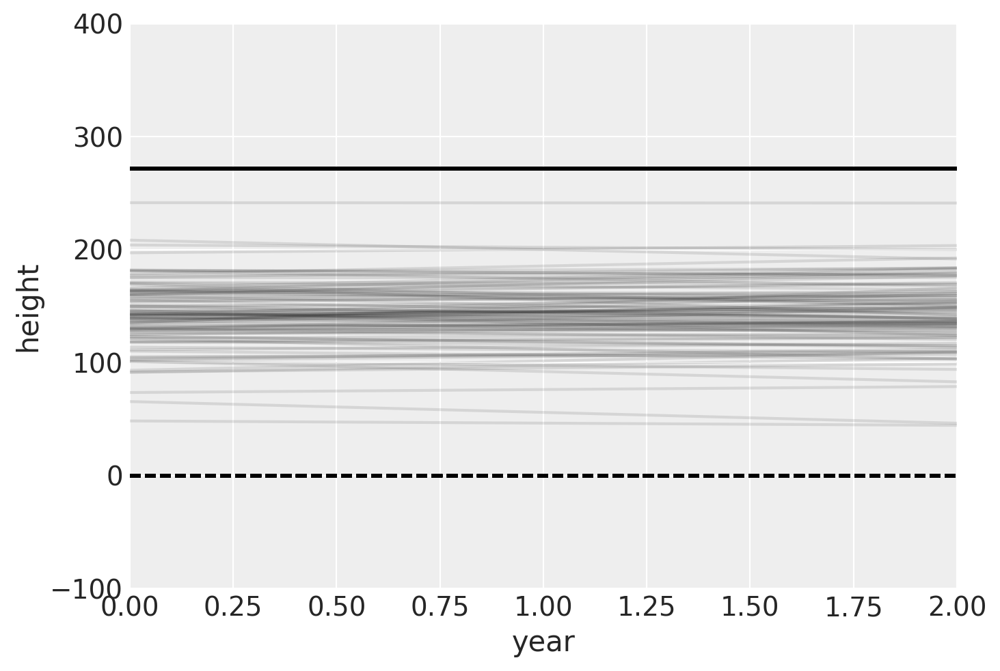

In [88]:
_, ax = plt.subplots(1, 1, sharey=True)
xbar = 1
for i in range(N):
    ax.plot(x, alpha[i] + beta[i] * (x - xbar) + normal_add[i], "k", alpha=0.1)
    ax.set_xlim(0, 2)
    ax.set_ylim(-100, 400)
    ax.axhline(0, c="k", ls="--")
    ax.axhline(272, c="k")
    ax.set_xlabel("year")
    ax.set_ylabel("height")

#### 4M5

$height_i \sim N(\mu_i, \sigma)$

$\mu_i = \alpha + \beta year_i$

$\alpha \sim N(158, 10)$

$\beta \sim logN(0, 5)$

$\sigma \sim U(0, 50)$

In [89]:
np.random.seed(2971)
N = 100
sigma = stats.uniform.rvs(0, 50, N)
beta = stats.lognorm.rvs(loc=1, scale=2, s=1, size=N)
alpha = stats.norm.rvs(140, 10, N)
normal_add = stats.norm.rvs(0, sigma, N)

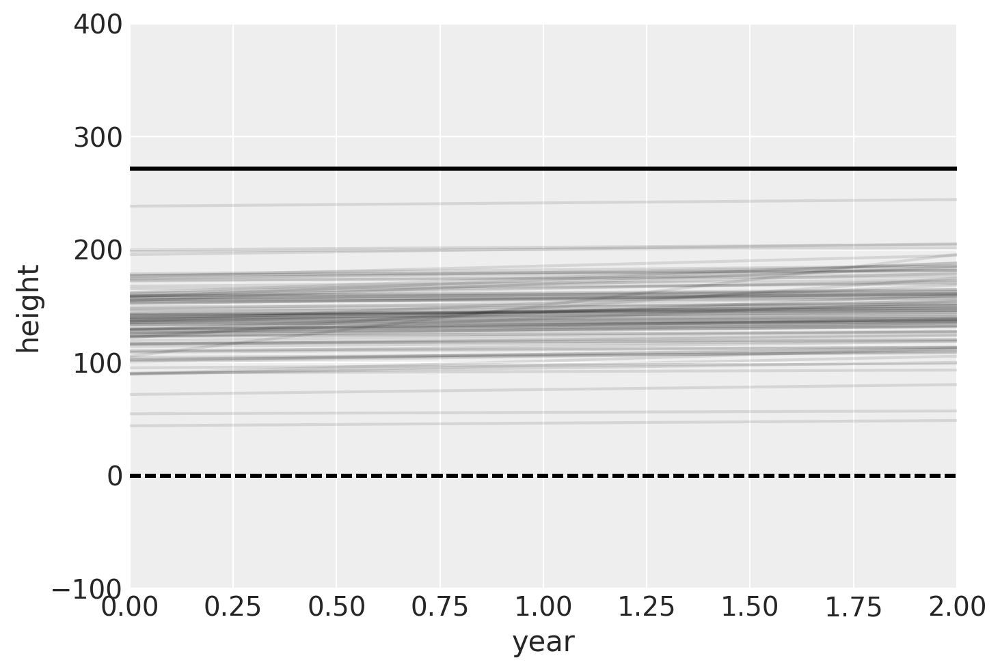

In [90]:
_, ax = plt.subplots(1, 1, sharey=True)
xbar = 1
for i in range(N):
    ax.plot(x, alpha[i] + beta[i] * (x - xbar) + normal_add[i], "k", alpha=0.1)
    ax.set_xlim(0, 2)
    ax.set_ylim(-100, 400)
    ax.axhline(0, c="k", ls="--")
    ax.axhline(272, c="k")
    ax.set_xlabel("year")
    ax.set_ylabel("height")

#### 4M6

$height_i \sim N(\mu_i, \sigma)$

$\mu_i = \alpha + \beta year_i$

$\alpha \sim N(158, 10)$

$\beta \sim logN(0, 5)$

$\sigma \sim U(0, 8)$

#### 4M7

In [181]:
d = pd.read_csv("Data/Howell1.csv", sep=";", header=0)
d2 = d[d.age >= 18]

In [182]:
xbar = d2.weight.mean()

In [183]:
with pm.Model() as m4_3:
    a = pm.Normal("a", mu=178, sd=20)
    b = pm.Lognormal("b", mu=0, sd=1)
    sigma = pm.Uniform("sigma", 0, 50)
    mu = a + b * (d2.weight - xbar)
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)
    trace_4_3 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 13 seconds.


In [184]:
with pm.Model() as m4_4M7:
    a = pm.Normal("a", mu=178, sd=20)
    b = pm.Lognormal("b", mu=0, sd=1)
    sigma = pm.Uniform("sigma", 0, 50)
    mu = a + b * d2.weight
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)
    trace_4_4M7 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 15 seconds.
The acceptance probability does not match the target. It is 0.8797929241691724, but should be close to 0.8. Try to increase the number of tuning steps.


In [185]:
az.summary(trace_4_3, kind="stats")

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:87: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
a,154.600,0.283,154.138,155.022
b,0.903,0.043,0.841,0.977
sigma,5.104,0.195,4.792,5.403


In [189]:
xbar

44.99048551988636

In [186]:
az.summary(trace_4_4M7, kind="stats")

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:87: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
a,114.608,1.920,111.635,117.692
b,0.889,0.042,0.824,0.959
sigma,5.106,0.195,4.780,5.399


In [187]:
trace_4_3_df = pm.trace_to_dataframe(trace_4_3)
trace_4_3_df.cov().round(3)

,a,b,sigma
a,0.08,-0.000,-0.000
b,-0.00,0.002,-0.000
sigma,-0.00,-0.000,0.038


In [188]:
trace_4_4M7_df = pm.trace_to_dataframe(trace_4_4M7)
trace_4_4M7_df.cov().round(3)

,a,b,sigma
a,3.685,-0.080,0.017
b,-0.080,0.002,-0.000
sigma,0.017,-0.000,0.038


/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/pymc3/sampling.py:1707: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:337: UserWarning: hpd will be deprecated Please replace hdi
  warnings.warn(("hpd will be deprecated " "Please replace hdi"),)
/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


(31.071052, 62.992589)

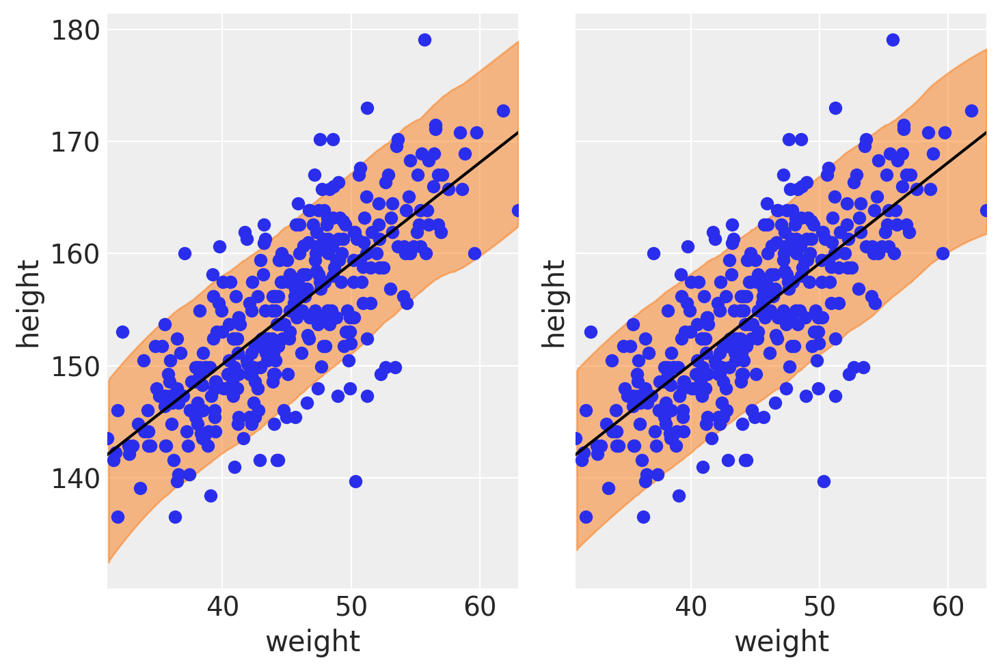

In [102]:
height_pred = pm.sample_posterior_predictive(trace_4_3, 200, m4_3)
height_pred_hpd = az.hpd(height_pred["height"])

height_pred2 = pm.sample_posterior_predictive(trace_4_4M7, 200, m4_4M7)
height_pred_hpd2 = az.hpd(height_pred2["height"])

_, ax = plt.subplots(1, 2, sharey=True)

az.plot_hpd(d2.weight, height_pred["height"], ax=ax[0])
ax[0].scatter(d2.weight, d2.height)
ax[0].plot(weight_seq, mu_mean, "k")
ax[0].set_xlabel("weight")
ax[0].set_ylabel("height")
ax[0].set_xlim(d2.weight.min(), d2.weight.max())


az.plot_hpd(d2.weight, height_pred2["height"], ax=ax[1])
ax[1].scatter(d2.weight, d2.height)
ax[1].plot(weight_seq, mu_mean, "k")
ax[1].set_xlabel("weight")
ax[1].set_ylabel("height")
ax[1].set_xlim(d2.weight.min(), d2.weight.max())

#### 4M8

In [104]:
d = pd.read_csv("Data/cherry_blossoms.csv")
# nans are not treated as in the book
az.summary(d.dropna().to_dict(orient="list"), kind="stats")

,mean,sd,hdi_5.5%,hdi_94.5%
year,1533.395,291.123,1123.00,1978.00
doy,104.921,6.258,95.00,114.00
temp,6.100,0.683,5.00,7.13
temp_upper,6.938,0.812,5.57,7.98
temp_lower,5.264,0.762,4.12,6.40


In [168]:
d2 = d.dropna(subset=["doy"])
num_knots = 30
knot_list = np.quantile(d2.year, np.linspace(0, 1, num_knots))

In [169]:
from patsy import dmatrix

B = dmatrix(
    "bs(year, knots=knots, degree=3, include_intercept=True) - 1",
    {"year": d2.year.values, "knots": knot_list[1:-1]},
)

In [172]:
with pm.Model() as m4_7:
    a = pm.Normal("a", 100, 10)
    w = pm.Normal("w", mu=0, sd=1000, shape=B.shape[1])
    mu = pm.Deterministic("mu", a + pm.math.dot(np.asarray(B, order="F"), w.T))
#     mu = pm.Deterministic("mu", a + pm.math.dot(B.base, w.T))
    sigma = pm.Exponential("sigma", 1)
    D = pm.Normal("D", mu, sigma, observed=d2.doy)
    trace_m4_7 = pm.sample(1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, w, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 34 seconds.
The acceptance probability does not match the target. It is 0.8905647211263571, but should be close to 0.8. Try to increase the number of tuning steps.
There were 851 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.3333595407399763, but should be close to 0.8. Try to increase the number of tuning steps.
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


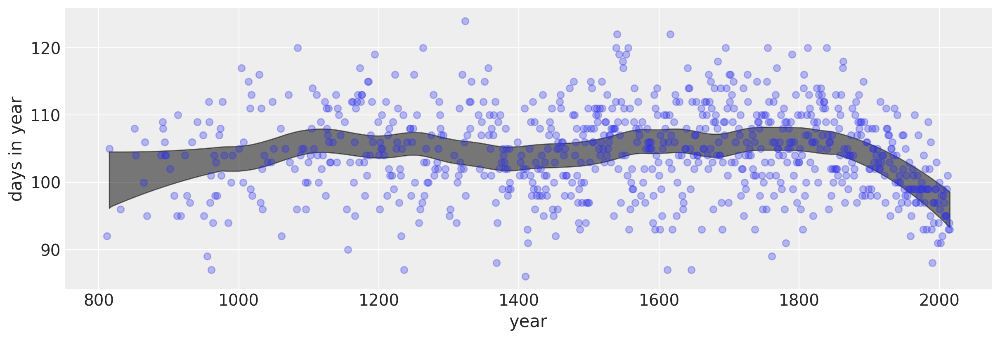

In [173]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))

ax.plot(d2.year, d2.doy, "o", alpha=0.3)
az.plot_hpd(d2.year, trace_m4_7["mu"], color="k", ax=ax)
ax.set_xlabel("year")
ax.set_ylabel("days in year");

#### 4H1

In [232]:
weights = np.array([46.95, 43.72, 64.78, 32.59, 54.63])

post_samples = []
for _ in range(1000):  # number of samples from the posterior
    i = np.random.randint(len(trace_4_3))
    mu_pr = trace_4_3["a"][i] + trace_4_3["b"][i] * (weights - d2.weight.mean())
    sigma_pred = trace_4_3["sigma"][i]
    post_samples.append(np.random.normal(mu_pr, sigma_pred))

In [233]:
post_samples = np.array(post_samples)

In [235]:
#expected height
post_samples.mean(0).round(1)

array([156.2, 153.6, 172.2, 143.4, 163.1])

In [239]:
#HDI
[az.hdi(i).round(1) for i in post_samples.T]

[array([148.7, 165. ]),
 array([146.2, 161.1]),
 array([163.9, 180.1]),
 array([134.7, 151.5]),
 array([154.5, 170.9])]

#### 4H2

In [343]:
d = pd.read_csv("Data/Howell1.csv", sep=";", header=0)
d_young = d.loc[d.age < 18, :]

In [344]:
d_young.shape

(192, 4)

In [345]:
xbar = d_young.weight.mean()

In [346]:
xbar

18.414193058854167

In [251]:
with pm.Model() as m4_4H2:
    a = pm.Normal("a", mu=110, sd=20)
    b = pm.Lognormal("b", mu=0, sd=1)
    sigma = pm.Uniform("sigma", 0, 50)
    mu = a + b * (d_young.weight - xbar)
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d_young.height)
    trace_4_4H2 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 13 seconds.


In [256]:
az.summary(trace_4_4H2, kind="stats")

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:87: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
a,108.318,0.619,107.355,109.290
b,2.718,0.070,2.604,2.824
sigma,8.545,0.463,7.858,9.329


In [289]:
weight_seq = np.arange(4.25, 44.7)
# Given that we have a lot of samples we can use less of them for plotting (or we can use all!)
trace_4_4H2_thinned = trace_4_4H2[::10]
mu_pred = np.zeros((len(weight_seq), len(trace_4_4H2_thinned) * trace_4_4H2.nchains))
for i, w in enumerate(weight_seq):
    mu_pred[i] = trace_4_4H2_thinned["a"] + trace_4_4H2_thinned["b"] * (
        w - d_young.weight.mean()
    )

In [290]:
height_pred = pm.sample_posterior_predictive(trace_4_4H2, 200, m4_4H2)
height_pred_hpd = az.hpd(height_pred["height"])

In [288]:
d_young.max()

height    158.115000
weight     44.735511
age        17.000000
male        1.000000
dtype: float64

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


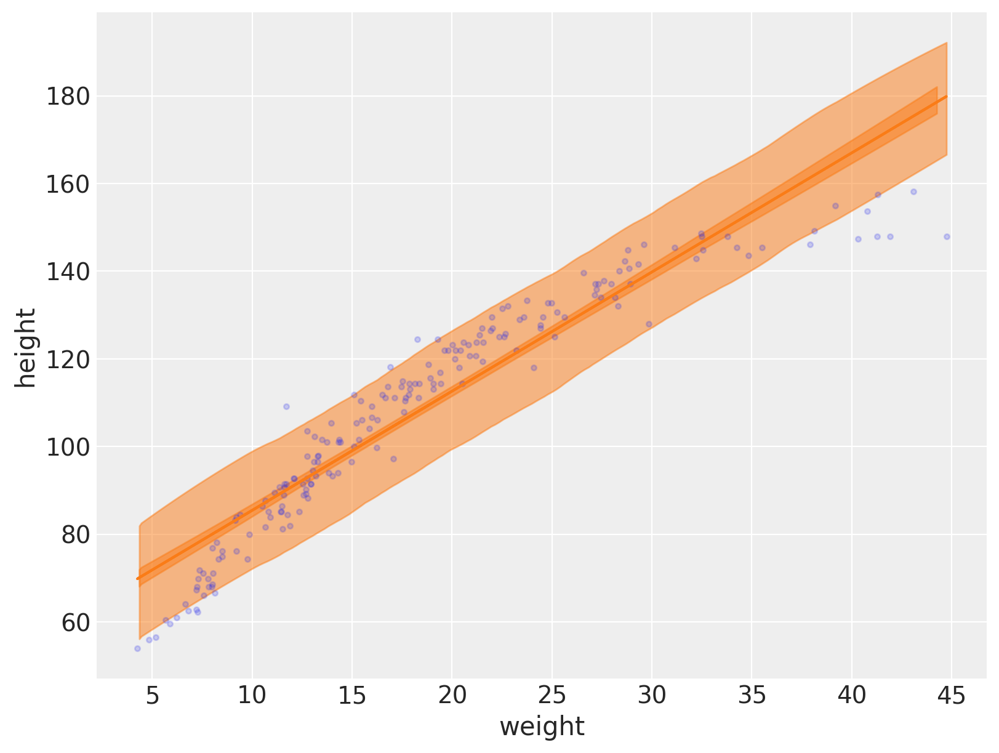

In [292]:
_, ax = plt.subplots(1, 1, figsize=(8, 6))

az.plot_hpd(weight_seq, mu_pred.T, ax=ax)
az.plot_hpd(d_young.weight, height_pred["height"], ax=ax)
ax.plot(d_young.weight, d_young.height, ".", alpha=0.2)
ax.plot(d_young.weight, trace_4_4H2["a"].mean() + trace_4_4H2["b"].mean() * (d_young.weight - xbar))
ax.set_xlabel(d_young.columns[1])
ax.set_ylabel(d_young.columns[0]);

Linear model does not seem to reflect the nature of the data well. Some non-linear transformation is needed.

#### 4H3

In [339]:
d = pd.read_csv("Data/Howell1.csv", sep=";", header=0)

In [340]:
d['weight_log'] = d.weight.apply(np.log)

In [341]:
xbar = d.weight_log.mean()

In [342]:
xbar

3.442329848013859

In [321]:
with pm.Model() as m4_4H3:
    a = pm.Normal("a", mu=110, sd=20)
    b = pm.Lognormal("b", mu=0, sd=1)
    sigma = pm.Uniform("sigma", 0, 50)
    mu = a + b * (d.weight_log - xbar)
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d.height)
    trace_4_4H3 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 15 seconds.


In [322]:
az.summary(trace_4_4H3, kind="stats")

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:87: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
a,138.261,0.228,137.906,138.629
b,47.068,0.390,46.440,47.677
sigma,5.157,0.159,4.907,5.406


In [324]:
weight_seq = np.arange(4, 71)
# Given that we have a lot of samples we can use less of them for plotting (or we can use all!)
trace_4_4H3_thinned = trace_4_4H3[::10]
mu_pred = np.zeros((len(weight_seq), len(trace_4_4H3_thinned) * trace_4_4H3.nchains))
for i, w in enumerate(weight_seq):
    mu_pred[i] = trace_4_4H3_thinned["a"] + trace_4_4H3_thinned["b"] * (
        np.log(w) - d.weight_log.mean()
    )

In [325]:
height_pred = pm.sample_posterior_predictive(trace_4_4H3, 200, m4_4H3)
height_pred_hpd = az.hpd(height_pred["height"])

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/pymc3/sampling.py:1707: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:337: UserWarning: hpd will be deprecated Please replace hdi
  warnings.warn(("hpd will be deprecated " "Please replace hdi"),)
/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


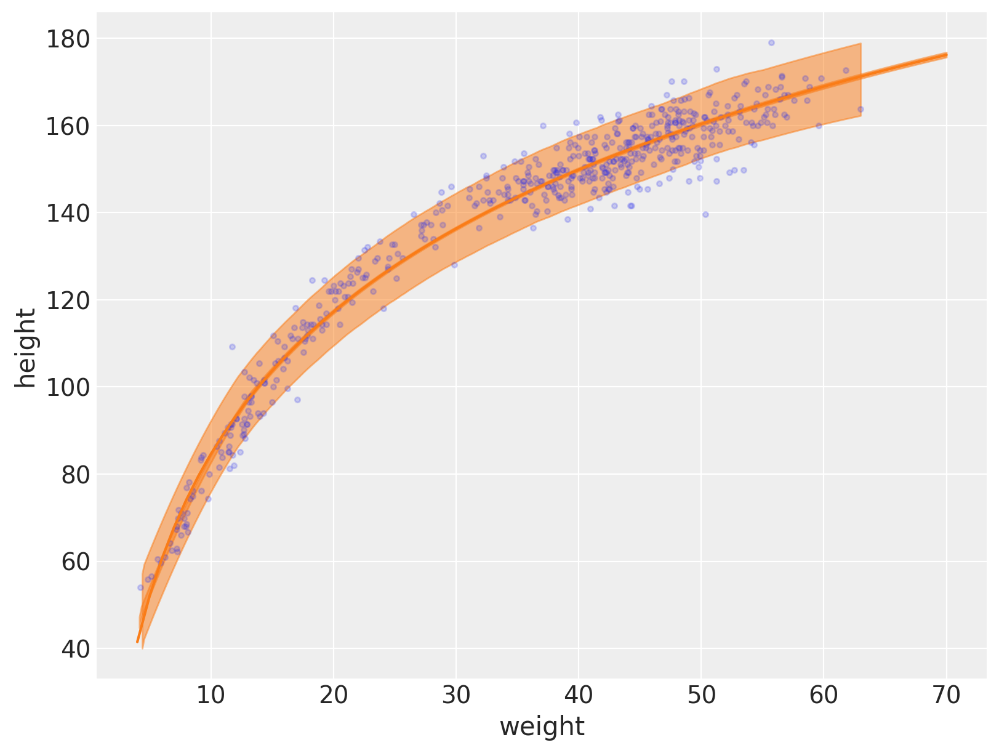

In [327]:
_, ax = plt.subplots(1, 1, figsize=(8, 6))

az.plot_hpd(weight_seq, mu_pred.T, ax=ax)
az.plot_hpd(d.weight, height_pred["height"], ax=ax)
ax.plot(d.weight, d.height, ".", alpha=0.2)
ax.plot(weight_seq, trace_4_4H3["a"].mean() + trace_4_4H3["b"].mean() * (np.log(weight_seq) - xbar))
ax.set_xlabel(d.columns[1])
ax.set_ylabel(d.columns[0]);

#### 4H4

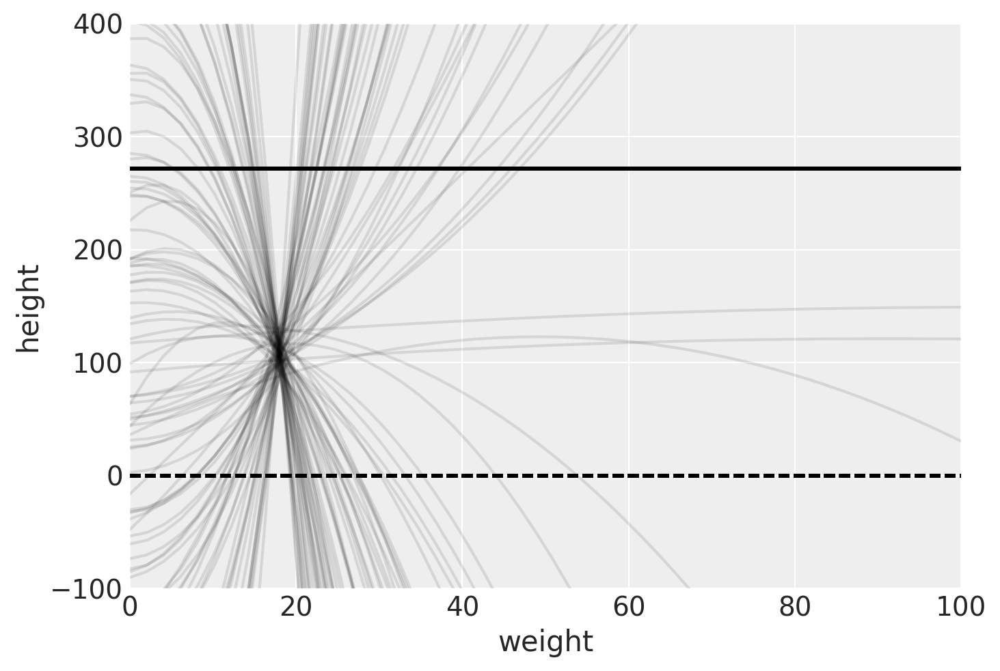

In [366]:
np.random.seed(2971)
N = 100
sigma = stats.uniform.rvs(0, 10, N)
beta1 = stats.lognorm.rvs(s=1, loc=0, size=N)
beta2 = stats.norm.rvs(0, 1, N)
alpha = stats.norm.rvs(110, 10, N)
normal_add = stats.norm.rvs(0, sigma)

_, ax = plt.subplots(1, 1, sharey=True)
x = np.linspace(0, 100)
xbar = 18
for i in range(N):
    ax.plot(x, alpha[i] + beta1[i] * (x - xbar) - beta2[i] * (x**2 - xbar ** 2) + normal_add[i], "k", alpha=0.1)
    ax.set_xlim(0, 100)
    ax.set_ylim(-100, 400)
    ax.axhline(0, c="k", ls="--")
    ax.axhline(272, c="k")
    ax.set_xlabel("weight")
    ax.set_ylabel("height")

#### 4H5

In [367]:
d = pd.read_csv("Data/cherry_blossoms.csv")
# nans are not treated as in the book
az.summary(d.dropna().to_dict(orient="list"), kind="stats")

,mean,sd,hdi_5.5%,hdi_94.5%
year,1533.395,291.123,1123.00,1978.00
doy,104.921,6.258,95.00,114.00
temp,6.100,0.683,5.00,7.13
temp_upper,6.938,0.812,5.57,7.98
temp_lower,5.264,0.762,4.12,6.40


In [370]:
d2 = d.dropna(subset=["doy", "temp"])
num_knots = 15
knot_list = np.quantile(d2.year, np.linspace(0, 1, num_knots))

In [372]:
from patsy import dmatrix

B = dmatrix(
    "bs(year, knots=knots, degree=3, include_intercept=True) - 1",
    {"year": d2.year.values, "knots": knot_list[1:-1]},
)

In [376]:
xbar = d2.temp.mean()

In [383]:
with pm.Model() as m4_4H5:
    a = pm.Normal("a", 100, 10)
    b = pm.Normal("b", mu=0, sd=1)
    mu = pm.Deterministic('mu', a + b * (d2.temp - xbar))
    sigma = pm.Exponential("sigma", 1)
    D = pm.Normal("D", mu=mu, sd=sigma, observed=d2.doy)
    trace_m4_4H5 = pm.sample(1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 15 seconds.


In [384]:
trace_m4_4H5.varnames

['a', 'b', 'sigma_log__', 'mu', 'sigma']

/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


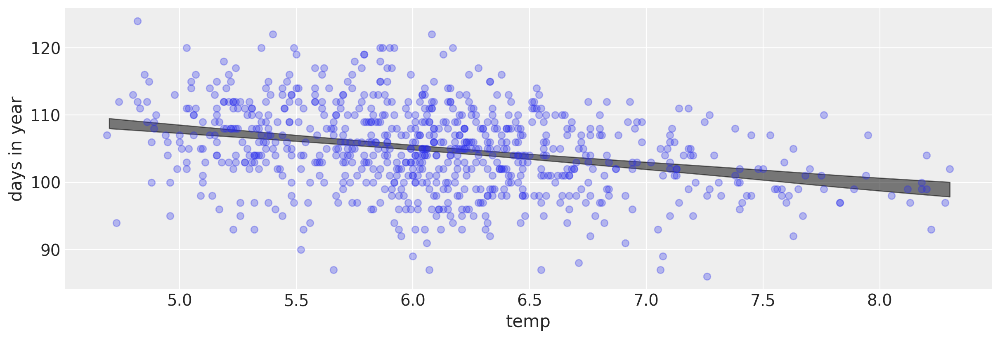

In [385]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))

ax.plot(d2.temp, d2.doy, "o", alpha=0.3)
az.plot_hpd(d2.temp, trace_m4_4H5["mu"], color="k", ax=ax)
ax.set_xlabel("temp")
ax.set_ylabel("days in year");

#### 4H6

In [402]:
d = pd.read_csv("Data/cherry_blossoms.csv")
# nans are not treated as in the book
az.summary(d.dropna().to_dict(orient="list"), kind="stats")

,mean,sd,hdi_5.5%,hdi_94.5%
year,1533.395,291.123,1123.00,1978.00
doy,104.921,6.258,95.00,114.00
temp,6.100,0.683,5.00,7.13
temp_upper,6.938,0.812,5.57,7.98
temp_lower,5.264,0.762,4.12,6.40


In [414]:
d = pd.read_csv("Data/cherry_blossoms.csv")
# nans are not treated as in the book
az.summary(d.dropna().to_dict(orient="list"), kind="stats")

,mean,sd,hdi_5.5%,hdi_94.5%
year,1533.395,291.123,1123.00,1978.00
doy,104.921,6.258,95.00,114.00
temp,6.100,0.683,5.00,7.13
temp_upper,6.938,0.812,5.57,7.98
temp_lower,5.264,0.762,4.12,6.40


In [415]:
d2 = d.dropna(subset=["doy"])
num_knots = 15
knot_list = np.quantile(d2.year, np.linspace(0, 1, num_knots))

In [416]:
from patsy import dmatrix

B = dmatrix(
    "bs(year, knots=knots, degree=3, include_intercept=True) - 1",
    {"year": d2.year.values, "knots": knot_list[1:-1]},
)

In [ ]:
with pm.Model() as m4_7:
    a = pm.Normal("a", 100, 10)
    w = pm.Normal("w", mu=0, sd=1000, shape=B.shape[1])
    mu = pm.Deterministic("mu", a + pm.math.dot(np.asarray(B, order="F"), w.T))
#     mu = pm.Deterministic("mu", a + pm.math.dot(B.base, w.T))
    sigma = pm.Exponential("sigma", 1)
    D = pm.Normal("D", mu, sigma, observed=d2.doy)
    trace_m4_7 = pm.sample(1000)

In [431]:
d2.min()

year          812.00
doy            86.00
temp            4.69
temp_upper      5.45
temp_lower      2.61
dtype: float64

In [432]:
d2.max()

year          2015.00
doy            124.00
temp             8.30
temp_upper      12.10
temp_lower       7.74
dtype: float64

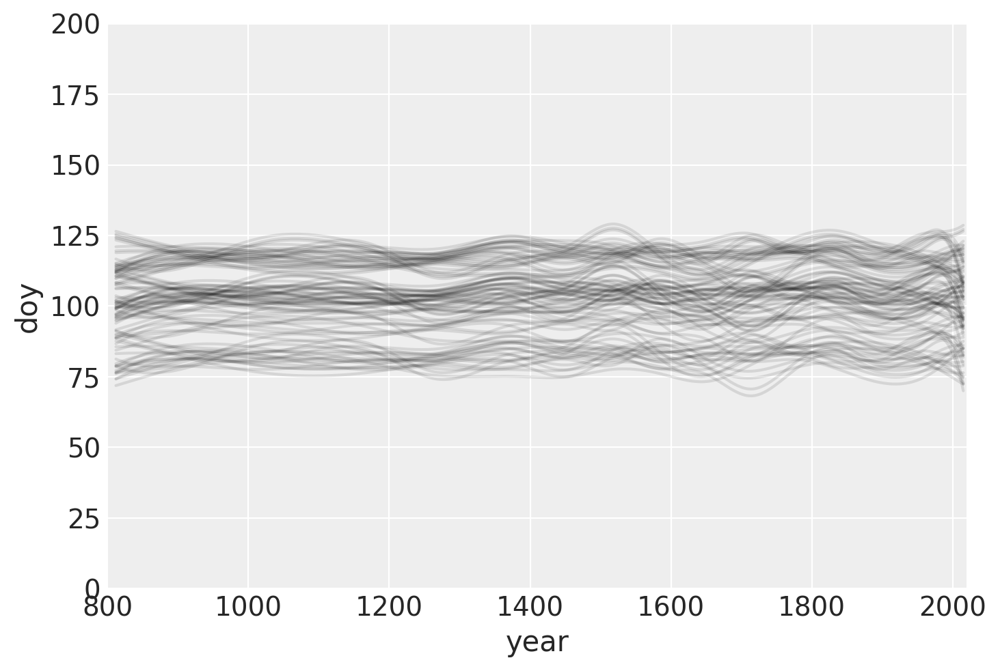

In [439]:
np.random.seed(2971)
N = 10
alpha = stats.norm.rvs(100, 10, N)
w = stats.norm.rvs(0, 5, (N, np.asarray(B, order="F").shape[1]))
sigma = stats.expon.rvs(1, N)
normal_add = stats.norm.rvs(0, sigma, N)

_, ax = plt.subplots(1, 1, sharey=True)
x = np.linspace(0, 100)
xbar = 18
for i in range(N):
    ax.plot(d2.year, alpha[i] + np.dot(np.asarray(B, order="F"), w.T) + normal_add[i], "k", alpha=0.1)
    ax.set_xlim(800, 2020)
    ax.set_ylim(0, 200)
    ax.set_xlabel("year")
    ax.set_ylabel("doy")

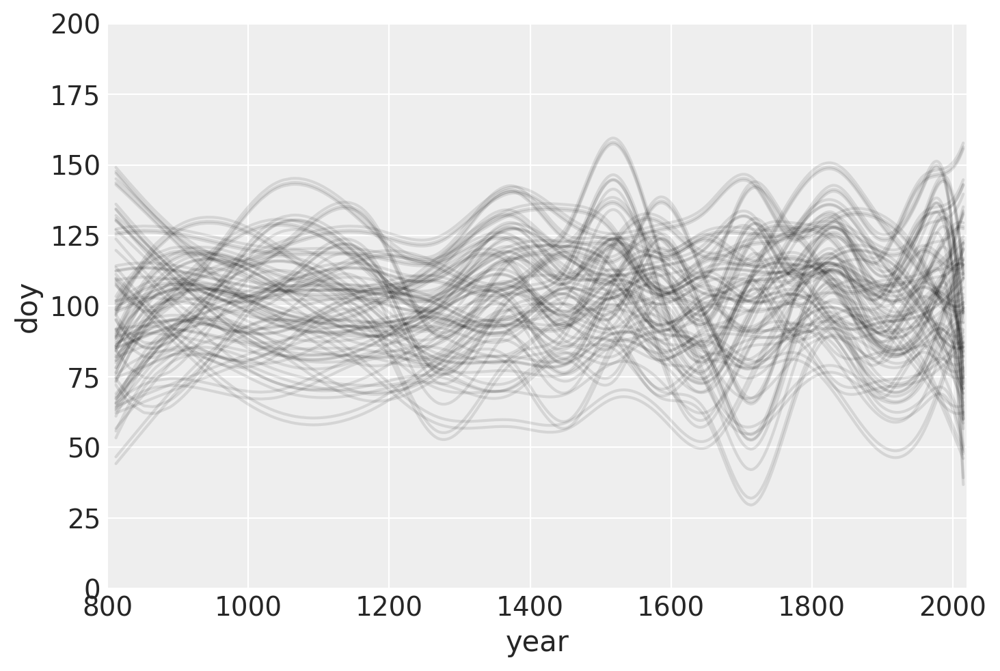

In [440]:
np.random.seed(2971)
N = 10
alpha = stats.norm.rvs(100, 10, N)
w = stats.norm.rvs(0, 20, (N, np.asarray(B, order="F").shape[1]))
sigma = stats.expon.rvs(1, N)
normal_add = stats.norm.rvs(0, sigma, N)

_, ax = plt.subplots(1, 1, sharey=True)
x = np.linspace(0, 100)
xbar = 18
for i in range(N):
    ax.plot(d2.year, alpha[i] + np.dot(np.asarray(B, order="F"), w.T) + normal_add[i], "k", alpha=0.1)
    ax.set_xlim(800, 2020)
    ax.set_ylim(0, 200)
    ax.set_xlabel("year")
    ax.set_ylabel("doy")

The prior controls the magnitude of the spline

#### 4H7/4H8

In [446]:
with pm.Model() as m4_4H7:
    w = pm.Normal("w", mu=0, sd=10, shape=B.shape[1])
    mu = pm.Deterministic("mu", pm.math.dot(np.asarray(B, order="F"), w.T))
    sigma = pm.Exponential("sigma", 1)
    D = pm.Normal("D", mu, sigma, observed=d2.doy)
    trace_m4_4H7 = pm.sample(1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, w]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 35 seconds.
The acceptance probability does not match the target. It is 0.9239658884399173, but should be close to 0.8. Try to increase the number of tuning steps.


/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


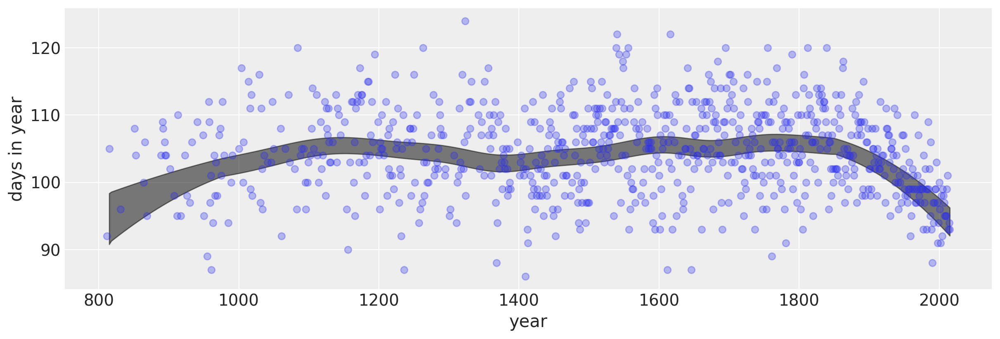

In [447]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))

ax.plot(d2.year, d2.doy, "o", alpha=0.3)
az.plot_hpd(d2.year, trace_m4_4H7["mu"], color="k", ax=ax)
ax.set_xlabel("year")
ax.set_ylabel("days in year");

Change the prior mean for ws ro reflect the begining and the end of the period.

In [448]:
with pm.Model() as m4_4H7:
    w = pm.Normal("w", mu=100, sd=10, shape=B.shape[1])
    mu = pm.Deterministic("mu", pm.math.dot(np.asarray(B, order="F"), w.T))
    sigma = pm.Exponential("sigma", 1)
    D = pm.Normal("D", mu, sigma, observed=d2.doy)
    trace_m4_4H7 = pm.sample(1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, w]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.


/Users/piotr.gabrys/.pyenv/versions/miniconda3-4.7.12/envs/stat-rethink2-pymc3/lib/python3.8/site-packages/arviz/stats/stats.py:482: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


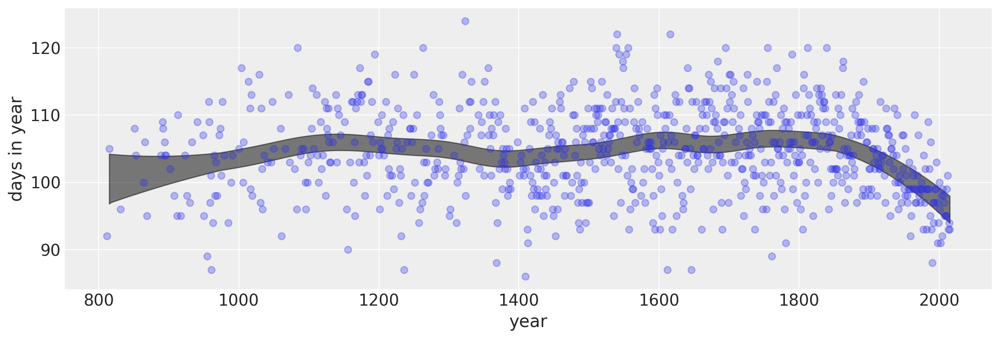

In [449]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))

ax.plot(d2.year, d2.doy, "o", alpha=0.3)
az.plot_hpd(d2.year, trace_m4_4H7["mu"], color="k", ax=ax)
ax.set_xlabel("year")
ax.set_ylabel("days in year");